# Analysis of NMF spatial and temporal components (peaks) and acc heart muscle traces
This is the exploratory script applied to one specific pupa

In [1]:
root_folder = "Z:/data/LD/experiments/imaging/output/Automated_experiment/pupa_10"

In [2]:
from my_utils import utils
import os
import pickle
import importlib
from matplotlib import pyplot as plt
from scipy.signal import find_peaks, peak_widths
import numpy as np
import cv2

In [3]:
recordings = utils.get_ordered_recording_paths(root_folder)

In [4]:
#Load all traces and nmf components
muscle_traces = []
control_traces = []
nmfs = []
for recording_number, recording in recordings:
    #analyse only up to 40 or all of them?
    folder_path = os.path.join(root_folder,recording)
    muscle_trace_path = os.path.join(folder_path, f"temporal_muscle_traces_{recording_number}_mcorr.pkl")
    control_trace_path = os.path.join(folder_path, f"temporal_control_traces_{recording_number}_mcorr.pkl")
    nmf_path = os.path.join(folder_path, f"nmf{recording_number}_components_mcorr.pkl")
    if os.path.exists(muscle_trace_path):
        with open(muscle_trace_path, "rb") as f:
            muscle_traces.append(pickle.load(f))
    if os.path.exists(control_trace_path):
        with open(control_trace_path, "rb") as f:
            control_traces.append(pickle.load(f))
    if os.path.exists(nmf_path):
        with open(nmf_path,"rb") as f:
            nmfs.append(pickle.load(f))

In [5]:
importlib.reload(utils)

<module 'my_utils.utils' from 'c:\\Master\\Master_thesis\\muscle_imaging\\Pipeline_analysis\\my_utils\\utils.py'>

In [46]:
plt.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 12,
    'axes.labelsize': 12,
    'xtick.direction': 'out',
    'ytick.direction': 'out',
    'axes.linewidth':1.5,
    'xtick.major.width': 1.5,
    'ytick.major.width': 1.5,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.grid': False,
})
N = 46
n_ticks = 10           
tick_locs = np.linspace(0, N-1, n_ticks, dtype=int)
tick_labels = [f"{-(N - loc)}" for loc in tick_locs]

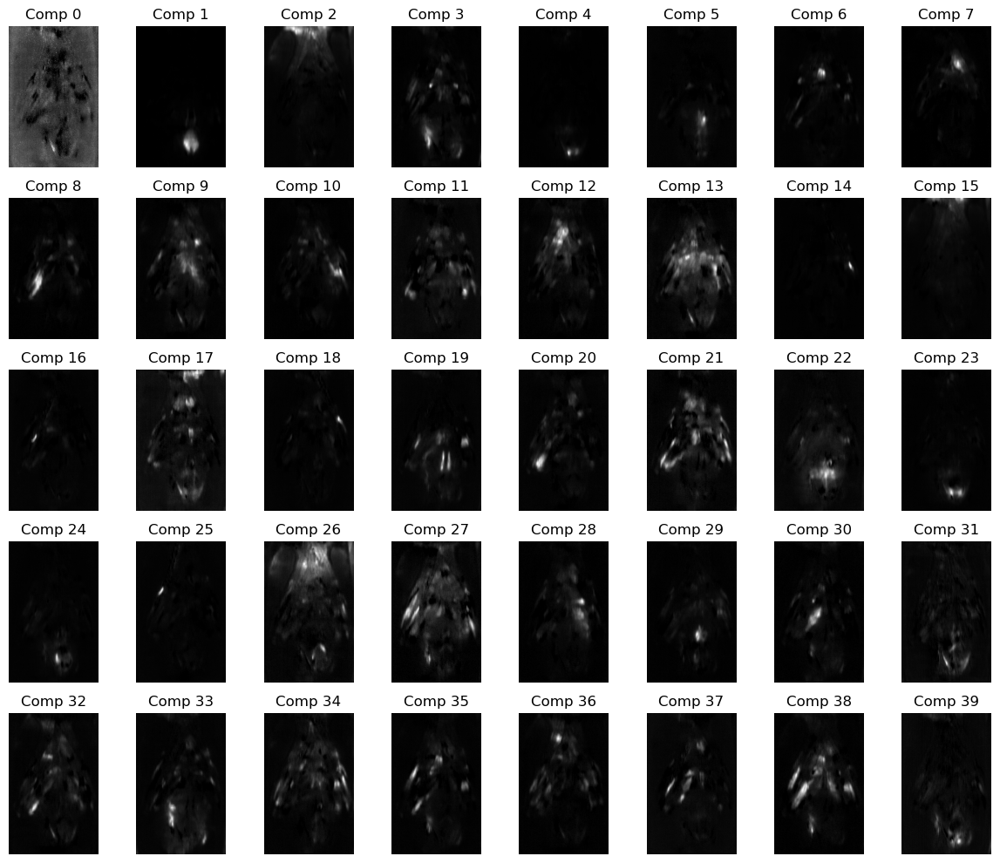

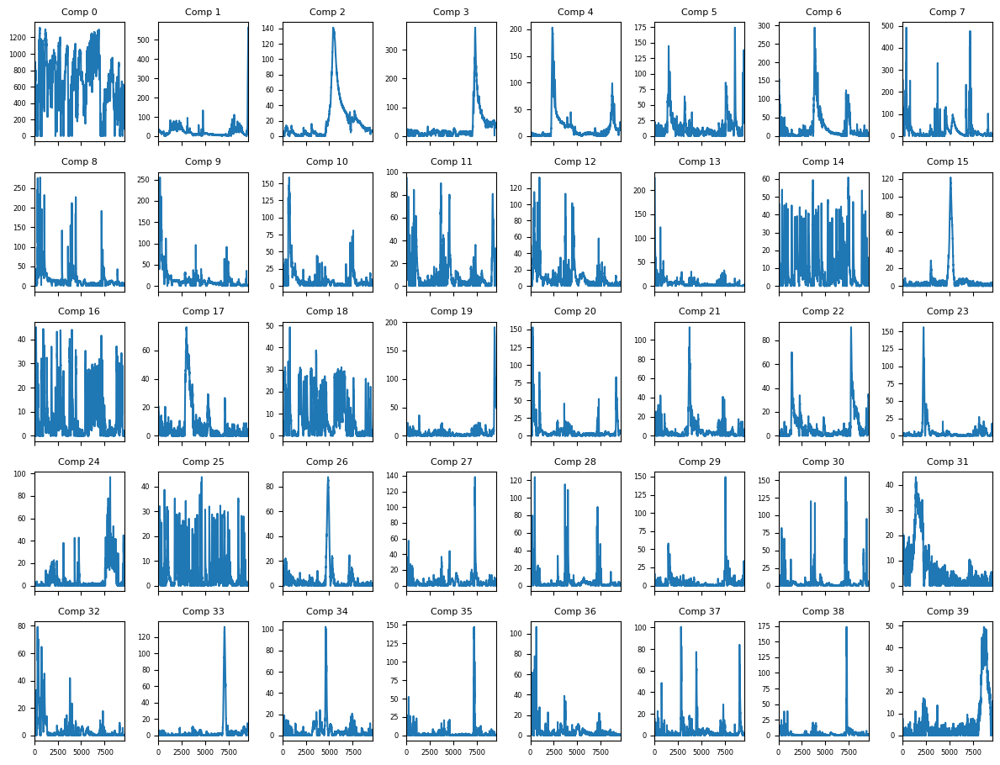

In [7]:
spatial_components, temporal_components = nmfs[40]
utils.visualize_nmf(spatial_components=spatial_components,temporal_components=temporal_components)

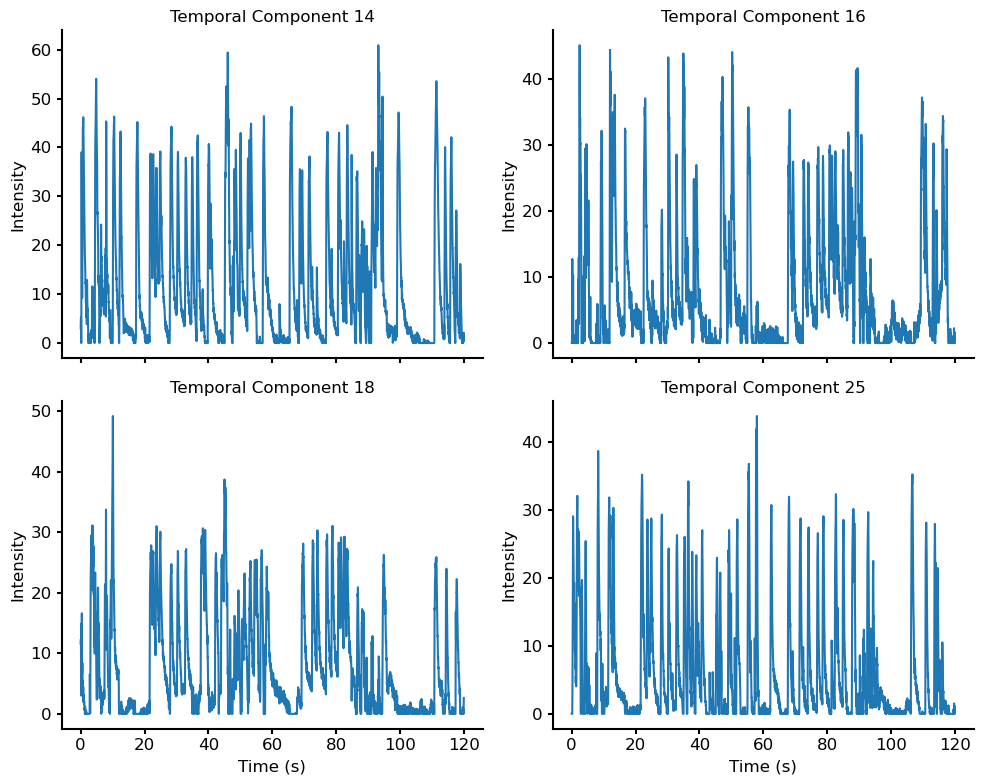

In [36]:
fps = 80
num_frames = temporal_components.shape[0]
time_sec = np.arange(num_frames) / fps

plt.figure(figsize=(10, 8))

for i, mask_index in enumerate([14, 16, 18, 25]):
    ax = plt.subplot(2, 2, i + 1)
    ax.plot(time_sec,temporal_components[:,mask_index], label=f"Mask {mask_index}")
    ax.set_ylabel("Intensity")
    ax.set_title(f"Temporal Component {mask_index}")
    ax.grid(False)
    if i < 2:
        # Top row: hide x‐tick labels entirely
        ax.tick_params(labelbottom=False)
    else:
        # Bottom row: show x‐axis in seconds
        ax.set_xlabel("Time (s)")

# Prevent titles/labels from overlapping
plt.tight_layout()
plt.show()

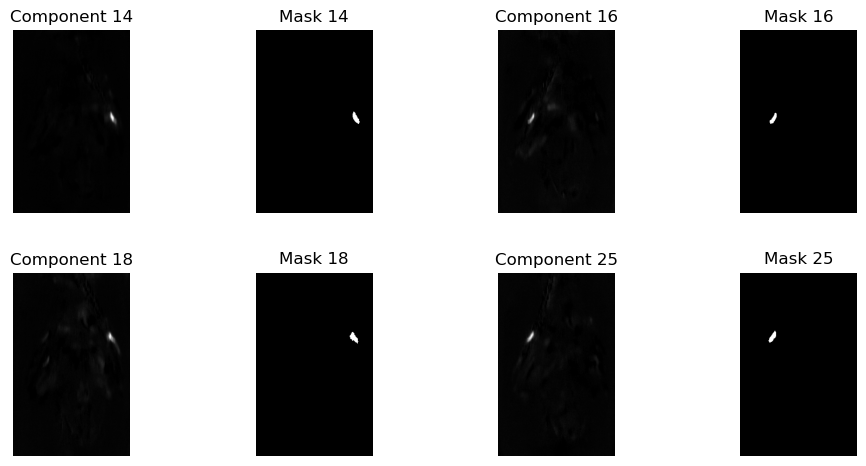

In [8]:
#use otsu thresholding to find the mask of the components
def fractional_threshold(component, fraction=0.2):
    # Normalize to 0–255
    comp = component.astype(np.float32)
    comp = 255 * (comp - comp.min()) / (comp.max() - comp.min())
    comp = comp.astype(np.uint8)

    # Apply threshold at specified fraction
    thresh_val = int(comp.max() * fraction)
    _, mask = cv2.threshold(comp, thresh_val, 255, cv2.THRESH_BINARY)
    return mask
otsu_mask_14 = fractional_threshold(spatial_components[14], fraction=0.2)
otsu_mask_16 = fractional_threshold(spatial_components[16], fraction=0.2)
otsu_mask_18 = fractional_threshold(spatial_components[18], fraction=0.2)
otsu_mask_25 = fractional_threshold(spatial_components[25], fraction=0.2)
#show components 12,17,19 and 29 next to their masks in a 2x4 grid
fig, axs = plt.subplots(2, 4, figsize=(10, 5))
axs[0, 0].imshow(spatial_components[14], cmap='gray')
axs[0, 0].set_title("Component 14")
axs[0, 1].imshow(otsu_mask_14, cmap='gray')
axs[0, 1].set_title("Mask 14")
axs[0, 2].imshow(spatial_components[16], cmap='gray')
axs[0, 2].set_title("Component 16")
axs[0, 3].imshow(otsu_mask_16, cmap='gray')
axs[0, 3].set_title("Mask 16")
axs[1, 0].imshow(spatial_components[18], cmap='gray')
axs[1, 0].set_title("Component 18")
axs[1, 1].imshow(otsu_mask_18, cmap='gray')
axs[1, 1].set_title("Mask 18")
axs[1, 2].imshow(spatial_components[25], cmap='gray')
axs[1, 2].set_title("Component 25")
axs[1, 3].imshow(otsu_mask_25, cmap='gray')
axs[1, 3].set_title("Mask 25")
plt.tight_layout()
#removes axes
for ax in axs.flat:
    ax.axis('off')

In [11]:
importlib.reload(utils)

<module 'my_utils.utils' from 'c:\\Master\\Master_thesis\\muscle_imaging\\Pipeline_analysis\\my_utils\\utils.py'>

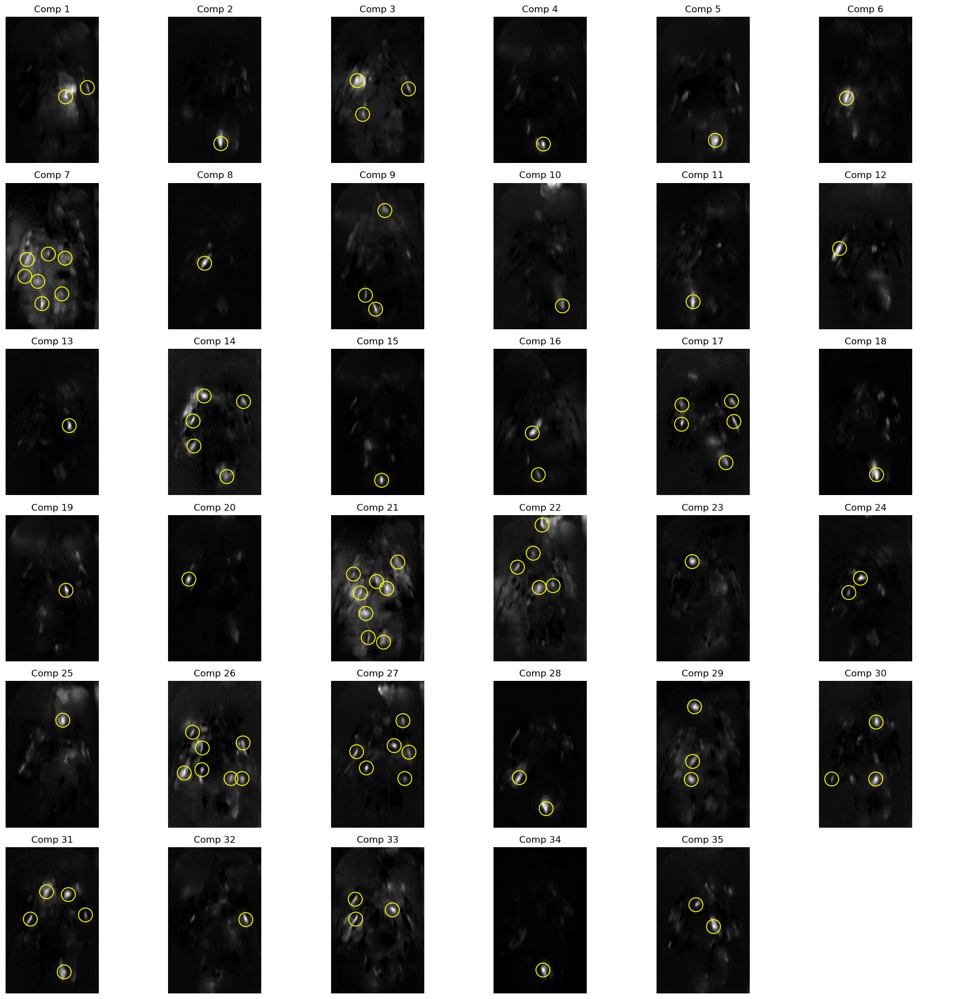

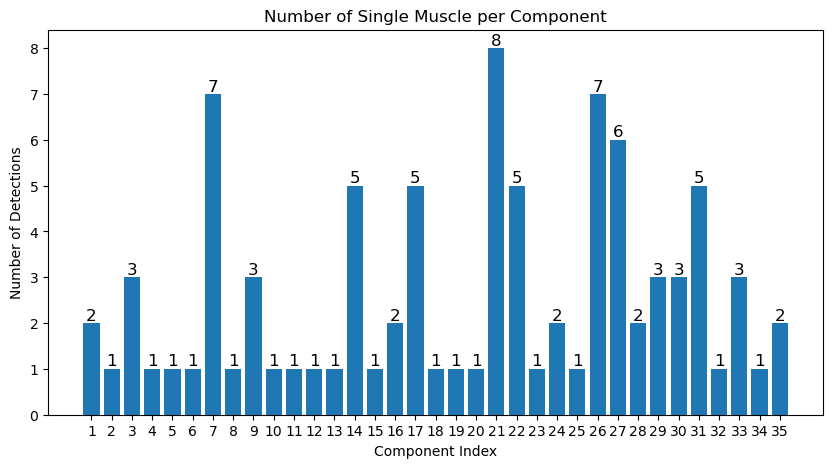

In [127]:
#identify background components to remove them from the analysis
background_component_ix= []
foreground_component_ix= []
for ix,h in enumerate(spatial_components):
    sparsity = utils.comp_sparsity(h)
    if sparsity > 40000.0:
        background_component_ix.append(ix)
    else: foreground_component_ix.append(ix)

detections_pk = utils.detect_blobs_via_peak_local_max(
    spatial_components,
    bg_idx= background_component_ix,
    min_distance=20,
    threshold_rel=0.5,
    exclude_border=True,
)

# plot them
utils.plot_peaks_on_components(spatial_components[foreground_component_ix], detections_pk, radius_factor=1.5)
# 3. Visualise number of detections per component
plt.figure(figsize=(10, 5))
plt.bar_label(plt.bar(range(len(detections_pk)), [len(d) for d in detections_pk]), fontsize=12)
plt.xticks(range(len(detections_pk)), [f"{i+1}" for i in range(len(detections_pk))])
plt.title("Number of Single Muscle per Component")
plt.xlabel("Component Index")
plt.ylabel("Number of Detections")
None


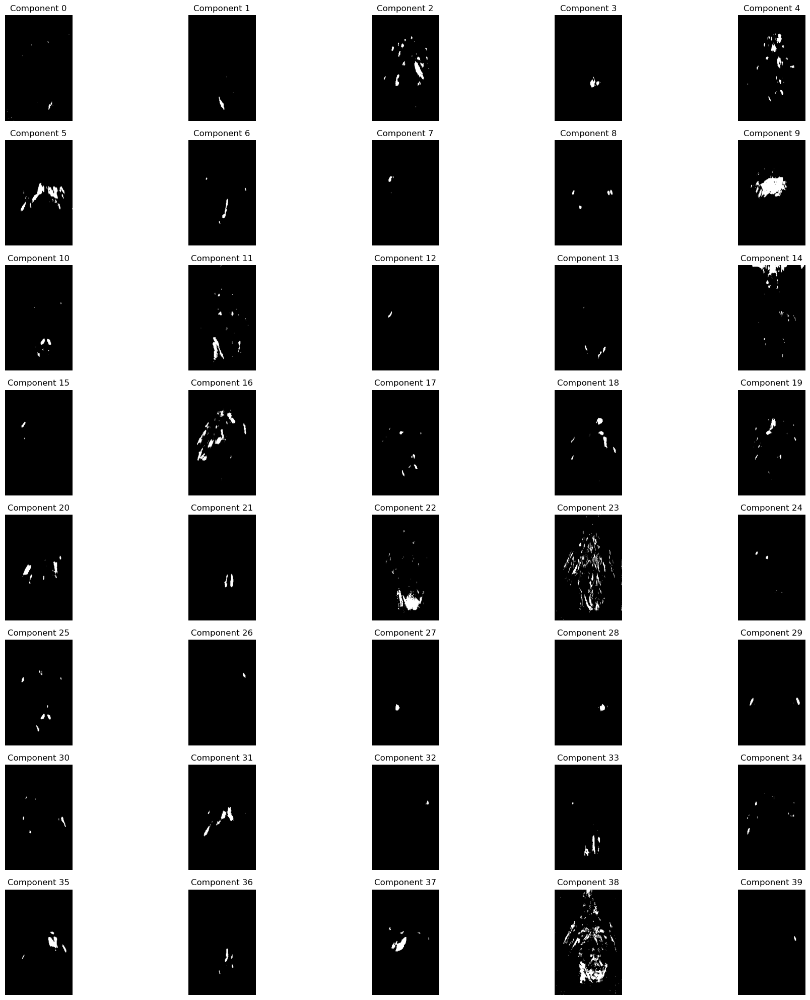

In [45]:
def fractional_threshold(component, fraction=0.2):
    # Normalize to 0–255
    comp = component.astype(np.float32)
    comp = 255 * (comp - comp.min()) / (comp.max() - comp.min())
    comp = comp.astype(np.uint8)

    # Apply threshold at specified fraction
    thresh_val = int(comp.max() * fraction)
    _, mask = cv2.threshold(comp, thresh_val, 255, cv2.THRESH_BINARY)
    return mask
spatial_components,_ = nmfs[50]
#identify background components to remove them from the analysis
background_component_ix= []
foreground_component_ix= []
for ix,h in enumerate(spatial_components):
    sparsity = utils.comp_sparsity(h)
    if sparsity > 40000.0:
        background_component_ix.append(ix)
    else: foreground_component_ix.append(ix)
foreground_component_ix = range(spatial_components.shape[0])

import math
import matplotlib.pyplot as plt

# 1) Compute masks for each foreground component
masks = [] 
for ix in foreground_component_ix:
    comp = spatial_components[ix]
    mask = fractional_threshold(comp, fraction=0.3)
    spars = utils.comp_sparsity(mask)
    masks.append((ix, mask, spars))

# Create subplots grid (adjust 8, 5 if needed based on number of components)
fig, axes = plt.subplots(8, 5, figsize=(20, 20))
axes = axes.flatten()  # Flatten to 1D array for easier indexing

# Plot masks
for i, (ix, mask,spars) in enumerate(masks):
    if i >= len(axes):
        break  # Avoid index error if more masks than subplots
    ax = axes[i]
    ax.imshow(mask, cmap='gray')
    ax.set_title(f"Component {ix}")#, spars: {spars:.2f}")
    ax.axis('off')

# Hide unused axes
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

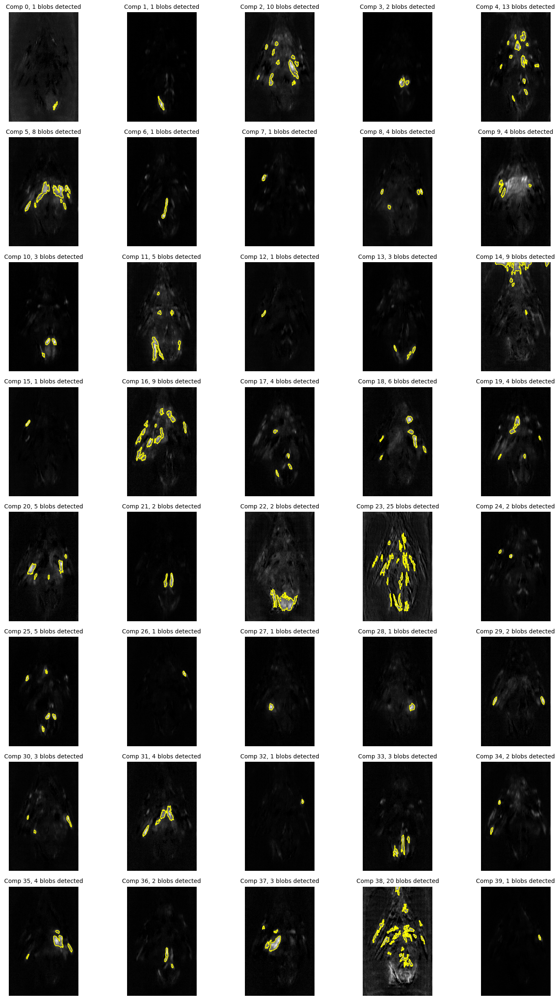

In [40]:
import math
import matplotlib.pyplot as plt
from skimage.measure import label, regionprops, find_contours
spatial_components = nmfs[50][0]

masks = []
foreground_component_ix = range(len(spatial_components))
for ix in foreground_component_ix:
    comp = spatial_components[ix]
    mask = utils.fractional_threshold(comp, fraction=0.3)
    masks.append((ix, mask))
# Parameters for filtering
min_area = 30
max_area = 2000

# Prepare a list of (idx, valid_contours) for each mask
contours_per_comp = []
blob_counts = []
for ix, mask in masks:  
    # 1) label and filter regions by area
    lbl = label(mask > 0)
    props = [p for p in regionprops(lbl) if min_area <= p.area <= max_area]

    # 2) extract contours for each valid region
    comp_contours = []
    for p in props:
        region_mask = (lbl == p.label)
        for contour in find_contours(region_mask, level=0.5):
            comp_contours.append(contour)
    contours_per_comp.append((ix, comp_contours))
    blob_counts.append((ix,len(props)))

# 3) Set up grid
n = len(contours_per_comp)
ncols = 5
nrows = math.ceil(n / ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*3, nrows*3), squeeze=False)
axes = axes.flatten()

# 4) Plot each component with its contours
for ax, ((ix, comp_contours),(_,nb_blobs)) in zip(axes, zip(contours_per_comp,blob_counts)):
    comp = spatial_components[ix]
    ax.imshow(comp, cmap='gray')
    ax.set_title(f"Comp {ix}, {nb_blobs} blobs detected", fontsize=10) #add number of contours per component
    ax.axis('off')

    # overlay contours
    for contour in comp_contours:
        ax.plot(contour[:, 1], contour[:, 0], color='yellow', linewidth=1.2)

# 5) Hide any unused subplots
for ax in axes[n:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

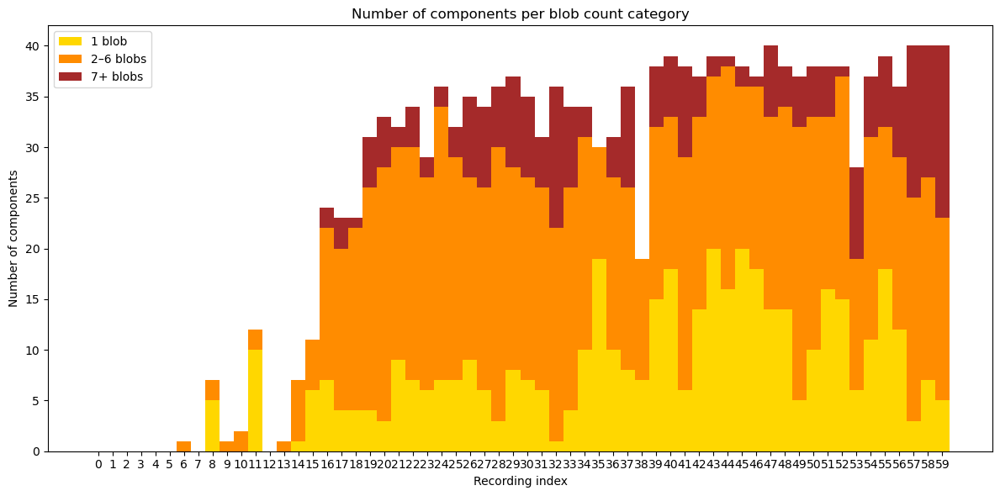

C:\Users\lpedu\AppData\Local\Temp\ipykernel_11732\2080183915.py:69: RuntimeWarning: invalid value encountered in divide
  pct_1 = count_1 / total * 100
C:\Users\lpedu\AppData\Local\Temp\ipykernel_11732\2080183915.py:70: RuntimeWarning: invalid value encountered in divide
  pct_2_4 = count_2_4 / total * 100
C:\Users\lpedu\AppData\Local\Temp\ipykernel_11732\2080183915.py:71: RuntimeWarning: invalid value encountered in divide
  pct_5plus = count_5plus / total * 100


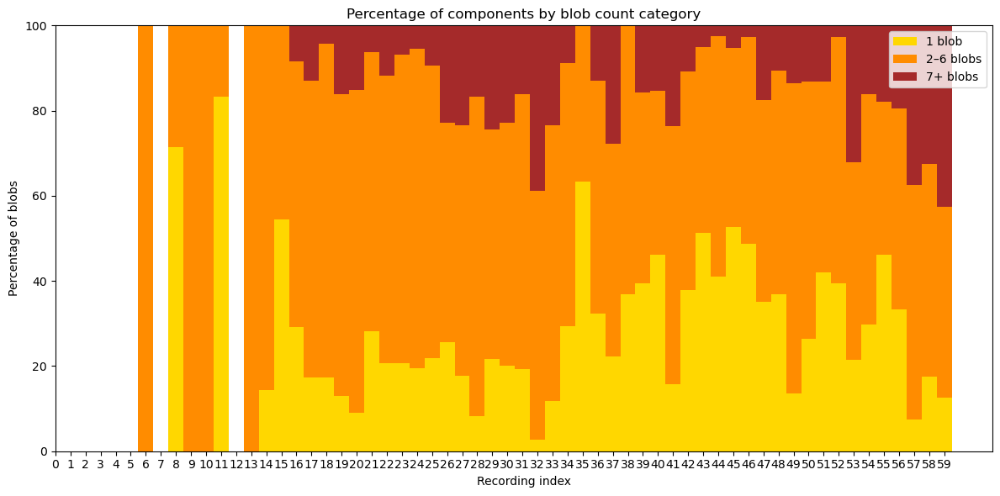

In [163]:
import numpy as np
import matplotlib.pyplot as plt

# Initialize raw counts
count_1 = []
count_2_4 = []
count_5plus = []

for i, nmf in enumerate(nmfs):
    spatial_components, _ = nmf
    background_component_ix = []
    foreground_component_ix = []

    # Classify components as foreground/background
    for ix, h in enumerate(spatial_components):
        sparsity = utils.comp_sparsity(h)
        if sparsity > 40000.0:
            background_component_ix.append(ix)
        else:
            foreground_component_ix.append(ix)

    # Apply your updated blob detection
    masks = []
    for ix in foreground_component_ix:
        comp = spatial_components[ix]
        mask = utils.fractional_threshold(comp, fraction=0.3)
        masks.append((ix, mask))

    min_area = 30
    max_area = 2000
    blob_counts = []

    for ix, mask in masks:
        lbl = label(mask > 0)
        props = [p for p in regionprops(lbl) if min_area <= p.area <= max_area]
        blob_counts.append((ix, len(props)))

    # Extract just the blob counts per component
    nb_muscles = [count for _, count in blob_counts]

    # Count how many components have 1, 2–4, or 5+ blobs
    count_1.append(sum(1 for n in nb_muscles if n == 1))
    count_2_4.append(sum(1 for n in nb_muscles if 2 <= n <= 6))
    count_5plus.append(sum(1 for n in nb_muscles if n >= 7))

# Convert to numpy arrays
count_1 = np.array(count_1)
count_2_4 = np.array(count_2_4)
count_5plus = np.array(count_5plus)

x = np.arange(len(nmfs))
bar_width = 1.0

# Plot 1: Raw counts
plt.figure(figsize=(12, 6))
plt.bar(x, count_1, label='1 blob', color="gold", width=bar_width)
plt.bar(x, count_2_4, bottom=count_1, label='2–6 blobs', color="darkorange", width=bar_width)
plt.bar(x, count_5plus, bottom=count_1 + count_2_4, label='7+ blobs', color="brown", width=bar_width)
plt.xlabel("Recording index")
plt.ylabel("Number of components")
plt.title("Number of components per blob count category")
plt.xticks(x)
plt.legend()
plt.tight_layout()
plt.show()

# Plot 2: Percentages
total = count_1 + count_2_4 + count_5plus
pct_1 = count_1 / total * 100
pct_2_4 = count_2_4 / total * 100
pct_5plus = count_5plus / total * 100

plt.figure(figsize=(12, 6))
plt.bar(x, pct_1, label='1 blob', color="gold", width=bar_width)
plt.bar(x, pct_2_4, bottom=pct_1, label='2–6 blobs', color="darkorange", width=bar_width)
plt.bar(x, pct_5plus, bottom=pct_1 + pct_2_4, label='7+ blobs', color="brown", width=bar_width)
plt.xlabel("Recording index")
plt.ylabel("Percentage of blobs")
plt.title("Percentage of components by blob count category")
plt.xticks(x)
plt.ylim(0, 100)
plt.legend()
plt.tight_layout()
plt.show()


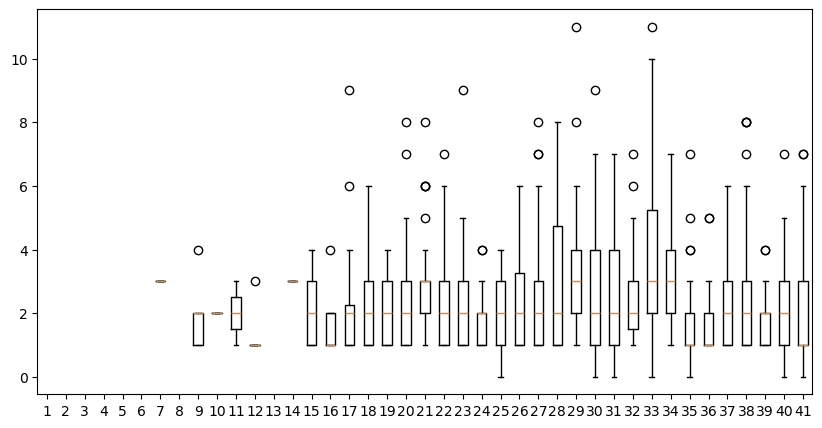

In [ ]:
#plot boxplots of the number of detected blobs per component per recording
nb_muscles_total = []
for i,nmf in enumerate(nmfs):
    spatial_components, _ =nmf
    background_component_ix= []
    foreground_component_ix= []
    for ix,h in enumerate(spatial_components):
        sparsity = utils.comp_sparsity(h)
        if sparsity > 40000.0:
            background_component_ix.append(ix)
        else: foreground_component_ix.append(ix)
    detections_pk = utils.detect_blobs_via_peak_local_max(
        spatial_components,
        bg_idx= background_component_ix,
        min_distance=20,
        threshold_rel=0.5,
        exclude_border=True,
    )
    nb_muscles = [len(d) for d in detections_pk]
    nb_muscles_total.append(nb_muscles)
plt.figure(figsize=(10, 5))
plt.boxplot(nb_muscles_total)
None

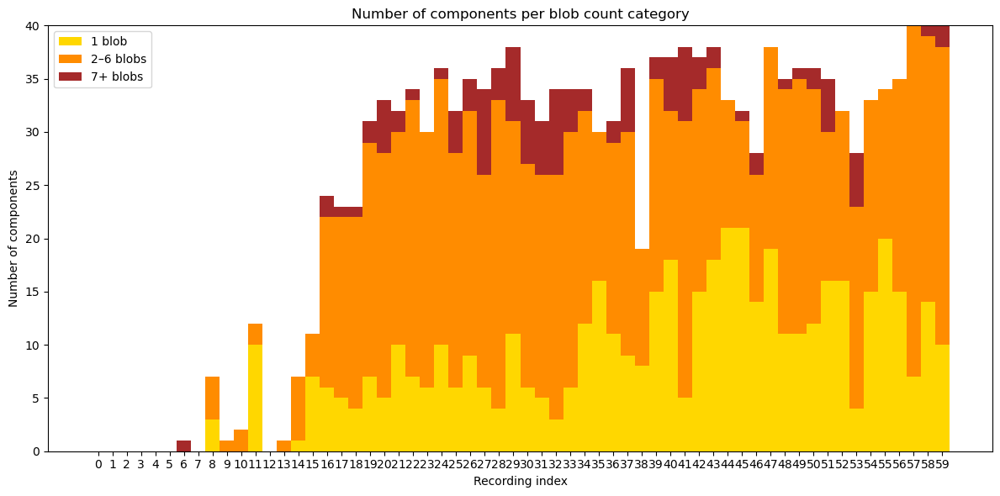

C:\Users\lpedu\AppData\Local\Temp\ipykernel_11732\3613695204.py:54: RuntimeWarning: invalid value encountered in divide
  pct_1 = count_1 / total * 100
C:\Users\lpedu\AppData\Local\Temp\ipykernel_11732\3613695204.py:55: RuntimeWarning: invalid value encountered in divide
  pct_2_4 = count_2_4 / total * 100
C:\Users\lpedu\AppData\Local\Temp\ipykernel_11732\3613695204.py:56: RuntimeWarning: invalid value encountered in divide
  pct_5plus = count_5plus / total * 100


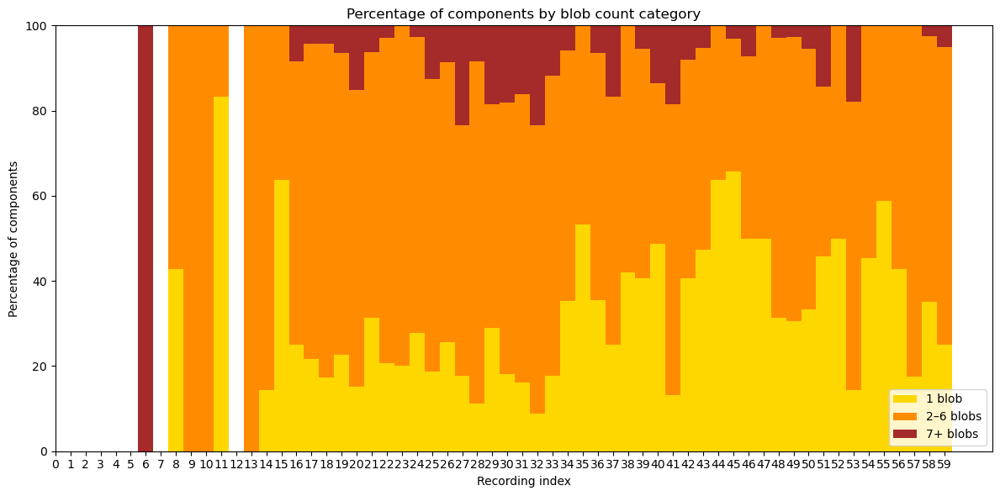

In [130]:
# Initialize raw counts
count_1 = []
count_2_4 = []
count_5plus = []

for i, nmf in enumerate(nmfs):
    spatial_components, _ = nmf
    background_component_ix = []
    foreground_component_ix = []

    for ix, h in enumerate(spatial_components):
        sparsity = utils.comp_sparsity(h)
        if sparsity > 40000.0:
            background_component_ix.append(ix)
        else:
            foreground_component_ix.append(ix)

    detections_pk = utils.detect_blobs_via_peak_local_max(
        spatial_components,
        bg_idx=background_component_ix,
        min_distance=20,
        threshold_rel=0.4,
        exclude_border=True,
    )

    nb_muscles = [len(d) for d in detections_pk]

    count_1.append(sum(1 for n in nb_muscles if n==1))
    count_2_4.append(sum(1 for n in nb_muscles if 2 <= n <= 6))
    count_5plus.append(sum(1 for n in nb_muscles if n >= 7))

bar_width = 1.0
# Convert to arrays
count_1 = np.array(count_1)
count_2_4 = np.array(count_2_4)
count_5plus = np.array(count_5plus)

# Plot 1: Raw counts
x = np.arange(len(nmfs))
plt.figure(figsize=(12, 6))
plt.bar(x, count_1, label='1 blob', color="gold", width=bar_width)
plt.bar(x, count_2_4, bottom=count_1, label='2–6 blobs', color="darkorange", width=bar_width)
plt.bar(x, count_5plus, bottom=count_1 + count_2_4, label='7+ blobs', color ="brown", width=bar_width)
plt.xlabel("Recording index")
plt.ylabel("Number of components")
plt.title("Number of components per blob count category")
plt.xticks(x)
plt.legend()
plt.tight_layout()
plt.show()

# Plot 2: Percentages
total = count_1 + count_2_4 + count_5plus
pct_1 = count_1 / total * 100
pct_2_4 = count_2_4 / total * 100
pct_5plus = count_5plus / total * 100

plt.figure(figsize=(12, 6))
plt.bar(x, pct_1, label='1 blob', color="gold", width=bar_width)
plt.bar(x, pct_2_4, bottom=pct_1, label='2–6 blobs',color="darkorange", width=bar_width)
plt.bar(x, pct_5plus, bottom=pct_1 + pct_2_4, label='7+ blobs', color="brown", width=bar_width)
plt.xlabel("Recording index")
plt.ylabel("Percentage of components")
plt.title("Percentage of components by blob count category")
plt.xticks(x)
plt.ylim(0, 100)
plt.legend()
plt.tight_layout()
plt.show()


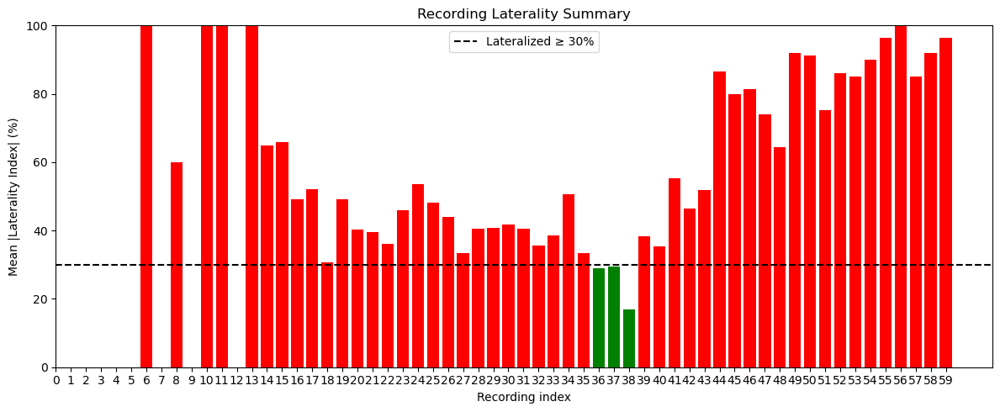

In [167]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import label, regionprops

# Helper: signed Laterality Index
def signed_li(centroids, comp_width):
    xs = [x for (y, x) in centroids]
    mid = comp_width / 2
    nL = sum(x < mid for x in xs)
    nR = sum(x >= mid for x in xs)
    tot = nL + nR
    return None if tot < 2 else (nR - nL) / tot * 100

threshold = 30  # %    

mean_abs_li = []
rec_idxs = []

for rec_idx, nmf in enumerate(nmfs):
    spatial_components, _ = nmf
    fg_idx = [ix for ix, h in enumerate(spatial_components)
              if utils.comp_sparsity(h) <= 40000.0]

    lis = []
    for ix in fg_idx:
        comp = spatial_components[ix]
        mask = fractional_threshold(comp, fraction=0.3)
        lbl = label(mask > 0)
        props = [p for p in regionprops(lbl) if 30 <= p.area <= 2000]
        if len(props) < 2:
            continue

        cents = [p.centroid for p in props]
        li = signed_li(cents, comp.shape[1])
        if li is not None:
            lis.append(abs(li))

    # only record if we had any valid components
    if lis:
        mean_abs_li.append(np.mean(lis))
        rec_idxs.append(rec_idx)
    else:
        mean_abs_li.append(np.nan)
        rec_idxs.append(rec_idx)

# Plot
colors = ['red' if v >= threshold else 'green' for v in mean_abs_li]

plt.figure(figsize=(12,5))
bars = plt.bar(rec_idxs, mean_abs_li, color=colors, width=0.8)
plt.axhline(threshold, color='black', linestyle='--', label=f'Lateralized ≥ {threshold}%')

plt.xlabel("Recording index")
plt.ylabel("Mean |Laterality Index| (%)")
plt.title("Recording Laterality Summary")
plt.xticks(rec_idxs)
plt.ylim(0, 100)
plt.legend()
plt.tight_layout()
plt.show()


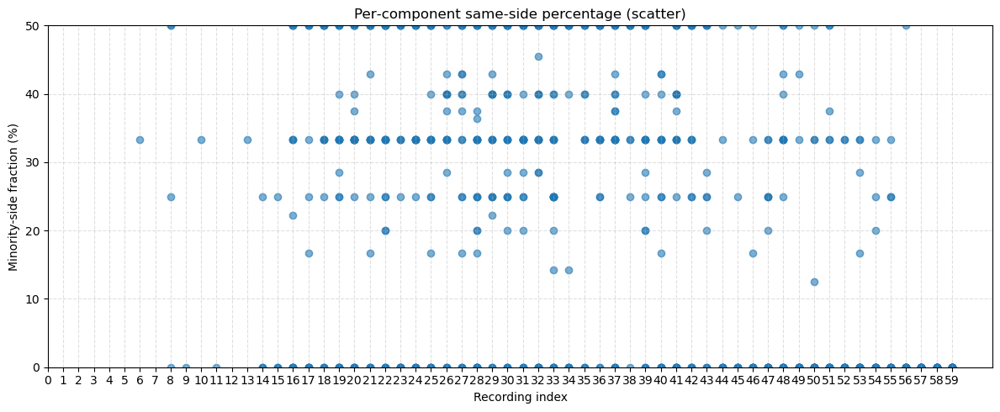

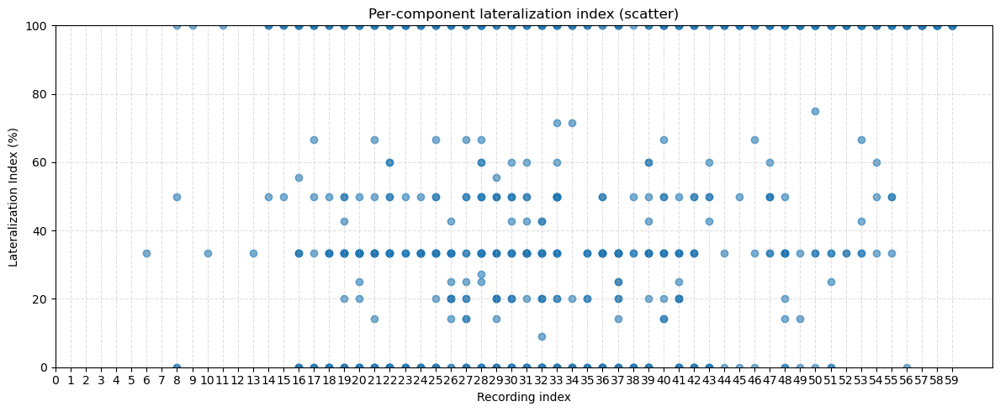

In [34]:
import numpy as np
import matplotlib.pyplot as plt

def lateralization_scores(detections, comp_shape):
    mid_x = comp_shape[1] / 2
    xs = [x for (_, x, _) in detections]
    nL = sum(1 for x in xs if x < mid_x)
    nR = sum(1 for x in xs if x >= mid_x)
    total = nL + nR
    if total < 2:
        return None, None
    min_frac = min(nL, nR) / total * 100
    LI = abs(nL - nR) / total * 100
    return min_frac, LI

# Collect per-component scores
perc_minority = []   # “same‑side” % per component
LI_scores     = []   # lateralization index per component
record_idxs   = []   # recording index for each point

for rec_idx, nmf in enumerate(nmfs):
    spatial_components, _ = nmf
    bg_idx = [ix for ix, h in enumerate(spatial_components) if utils.comp_sparsity(h) > 40000.0]
    detections_pk = utils.detect_blobs_via_peak_local_max(
        spatial_components,
        bg_idx=bg_idx,
        min_distance=20,
        threshold_rel=0.5,
        exclude_border=True,
    )
    for det, comp in zip(detections_pk, spatial_components):
        min_frac, LI = lateralization_scores(det, comp.shape)
        if min_frac is not None:
            perc_minority.append(min_frac)
            LI_scores.append(LI)
            record_idxs.append(rec_idx)

# Scatter plot: “same‑side” %
plt.figure(figsize=(12, 5))
plt.scatter(record_idxs, perc_minority, alpha=0.6)
plt.xlabel("Recording index")
plt.ylabel("Minority‐side fraction (%)")
plt.title("Per‐component same‑side percentage (scatter)")
plt.ylim(0, 50)
plt.xticks(range(len(nmfs)))
plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

# Scatter plot: Lateralization Index
plt.figure(figsize=(12, 5))
plt.scatter(record_idxs, LI_scores, alpha=0.6)
plt.xlabel("Recording index")
plt.ylabel("Lateralization Index (%)")
plt.title("Per‐component lateralization index (scatter)")
plt.ylim(0, 100)
plt.xticks(range(len(nmfs)))
plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


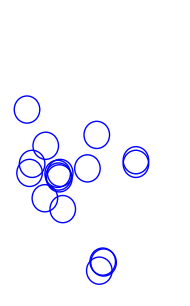

In [70]:
def plot_all_blobs(
    detections: list[np.ndarray],
    image_shape: tuple[int, int],
    radius_factor: float = 1.0,
    figsize: tuple[int, int] | None = None
) -> None:
    """
    Plot all detected blob centers on a single black canvas.

    Parameters
    ----------
    detections : list of np.ndarray
        List of (N, 3) arrays, each with (y, x, r) coordinates for blobs from each component.
    image_shape : tuple[int,int]
        (height, width) of the output canvas matching your spatial map size.
    radius_factor : float, optional
        Scale factor applied to each blob radius for visualization.
    figsize : tuple[int,int], optional
        Figure size in inches; if None, inferred from image dimensions.
    """
    H, W = image_shape
    if figsize is None:
        # default: 1 inch per 100 pixels
        figsize = (W / 100.0, H / 100.0)

    fig, ax = plt.subplots(figsize=figsize)
    # black background
    ax.set_facecolor('black')
    ax.set_xlim(0, W)
    ax.set_ylim(H, 0)

    # draw each blob as white circle
    for blobs in detections:
        for y, x, r in blobs:
            circ = plt.Circle((x, y), r * radius_factor,
                              edgecolor='blue', facecolor='none', linewidth=1.0)
            ax.add_patch(circ)

    ax.axis('off')
    plt.tight_layout()
    plt.show()

plot_all_blobs(detections_pk,spatial_components.shape[1:], radius_factor=1.5)

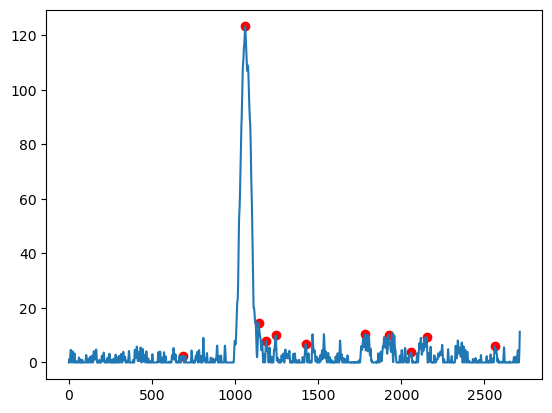

In [17]:
plt.plot(nmfs[31][1][:,11])
peaks, stats = find_peaks(nmfs[31][1][:,11],prominence=2,width=8, rel_height=0.5, distance=8)
plt.scatter(peaks, nmfs[31][1][peaks,11], color="red")

In [61]:
importlib.reload(utils)

<module 'my_utils.utils' from 'c:\\Master\\Master_thesis\\muscle_imaging\\Pipeline_analysis\\my_utils\\utils.py'>

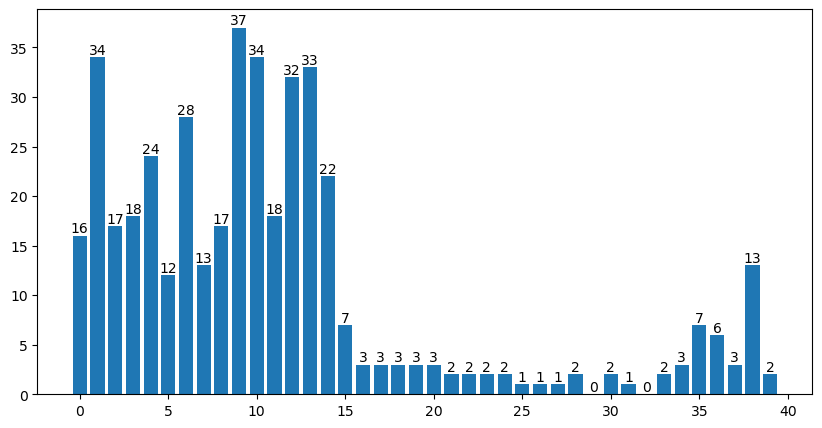

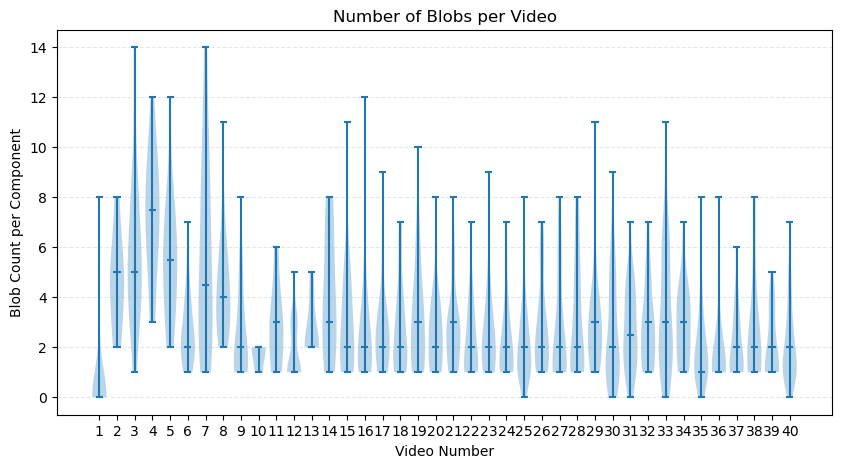

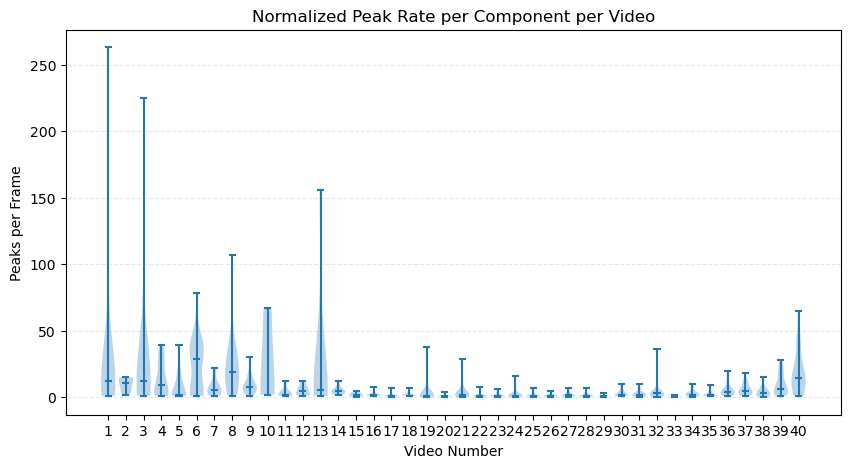

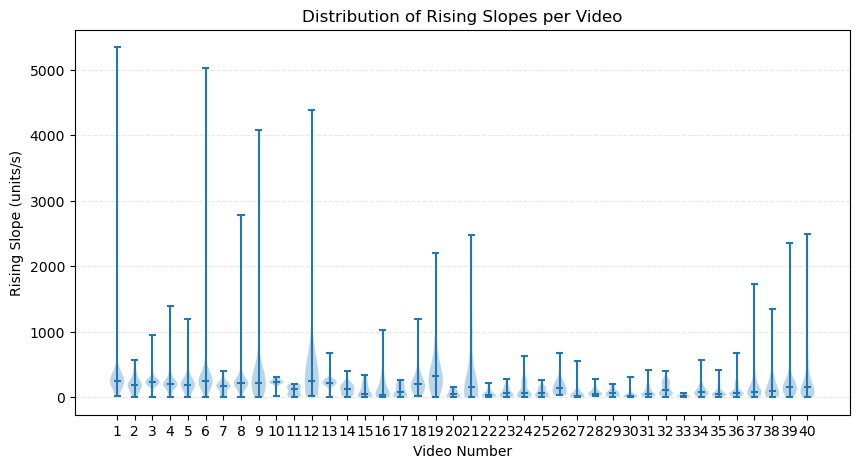

In [18]:
# Set parameters
fs = 80
nb_blobs_total = []   # per-video list of blob counts (one list per video)
nb_peaks_total = []   # per-video list of normalized peak counts per component
slopes_total = []     # per-video list of all per-peak slopes across components
nb_bg = []            # number of background components per video

# Assume `nmfs` is a list of (spatial_components, temporal_components) tuples
# spatial_components: shape (K, H, W) or (K, H*W)
for ix,nmf in enumerate(nmfs):
    if ix >= 40:
        continue
    spatial_components, temporal_components = nmf
    # identify background
    cov = utils.coverage_ratio(spatial_components, thresh=0.1)
    bg_idx = np.where(cov > 0.7)[0]
    nb_bg.append(len(bg_idx))

    # detect blobs on all non-background maps
    all_detections = utils.detect_blobs_via_peak_local_max(
        spatial_components,
        bg_idx,
        min_distance=20,
        threshold_rel=0.5,
        exclude_border=True
    )
    # count blobs per non-bg component
    blob_counts = [len(d) for d in all_detections]
    nb_blobs_total.append(blob_counts)

    # peaks and slopes per component
    peak_rates = []
    slopes_per_video = []
    for i in range(spatial_components.shape[0]):
        if i in bg_idx:
            continue
        trace = temporal_components[:, i]
        # find peaks
        peaks, _ = find_peaks(trace, prominence=15, width=0.1)
        # normalized peak count
        peak_rates.append(len(peaks))
        # compute slopes per peak
        if len(peaks) >= 2:
            widths, _, left_ips, _ = peak_widths(trace, peaks, rel_height=0.5)
            left_idxs = np.round(left_ips).astype(int)
            amp_peak = trace[peaks]
            amp_left = trace[left_idxs]
            t_peak = peaks / fs
            t_left = left_idxs / fs
            slopes = (amp_peak - amp_left) / (t_peak - t_left)
            slopes_per_video.extend(slopes)
    nb_peaks_total.append(peak_rates)
    slopes_total.append(slopes_per_video)

# === Plotting ===
videos = np.arange(40) + 1

plt.figure(figsize=(10,5))
plt.bar_label(plt.bar(range(40),nb_bg))

videos = np.arange(1, len(nb_blobs_total) + 1)

# 1) Blob counts
plt.figure(figsize=(10,5))
vp = plt.violinplot(
    nb_blobs_total,
    positions=videos,
    showmedians=True,
    widths=0.8
)
plt.xticks(videos)
plt.xlabel("Video Number")
plt.ylabel("Blob Count per Component")
plt.title("Number of Blobs per Video")
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.show()

# 2) Peak rates
plt.figure(figsize=(10,5))
vp = plt.violinplot(
    nb_peaks_total,
    positions=videos,
    showmedians=True,
    widths=0.8
)
plt.xticks(videos)
plt.xlabel("Video Number")
plt.ylabel("Peaks per Frame")
plt.title("Normalized Peak Rate per Component per Video")
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.show()

# 3) Rising slopes
plt.figure(figsize=(10,5))
vp = plt.violinplot(
    slopes_total,
    positions=videos,
    showmedians=True,
    widths=0.8
)
plt.xticks(videos)
plt.xlabel("Video Number")
plt.ylabel("Rising Slope (units/s)")
plt.title("Distribution of Rising Slopes per Video")
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.show()


In [23]:
len(muscle_traces[0][0])

3571

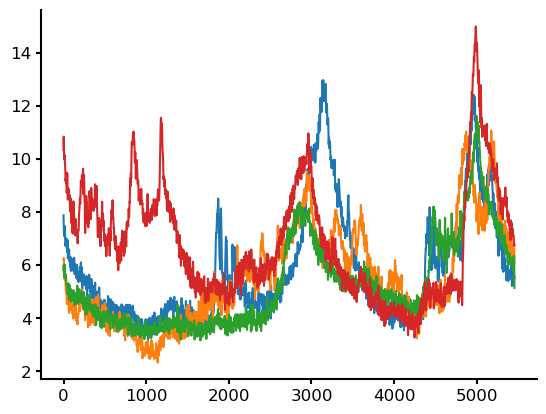

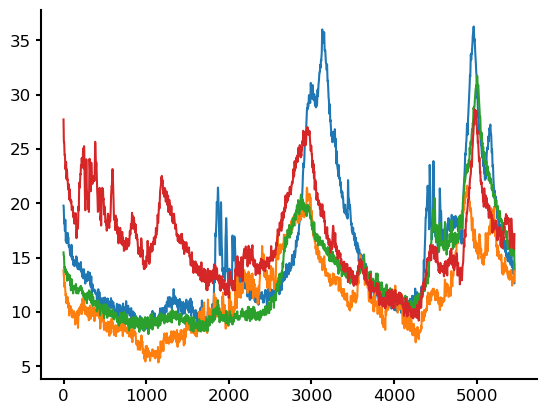

In [48]:
m1,m2,m3,m4 = muscle_traces[30]
plt.plot(m1)
plt.plot(m2)
plt.plot(m3)
plt.plot(m4)
plt.show()
c1,c2,c3,c4 = control_traces[30]
plt.plot(c1)
plt.plot(c2)
plt.plot(c3)
plt.plot(c4)
plt.show()

In [14]:
stats['left_ips']

array([1801.87419679])

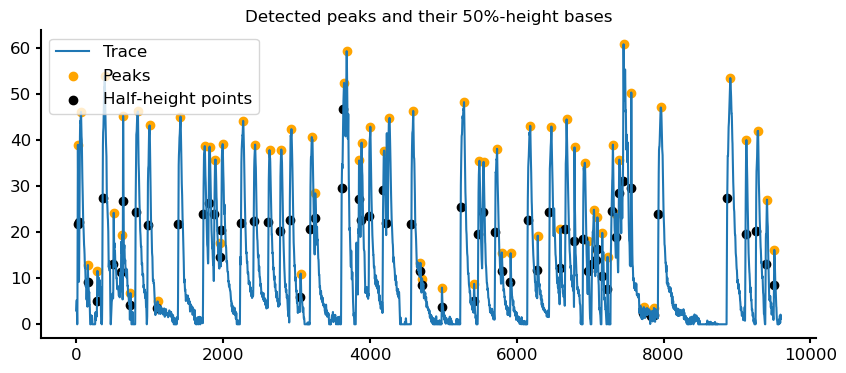

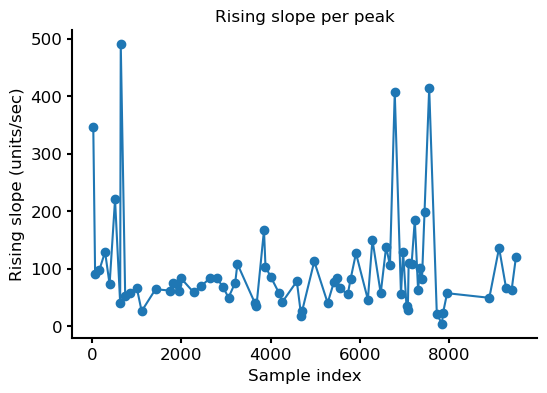

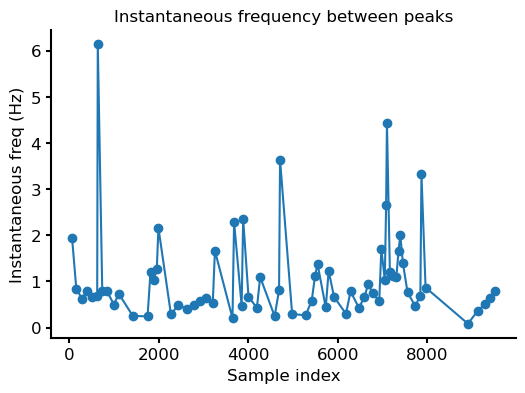

Found 71 peaks
Mean rising slope: 98.26 units/sec
Mean frequency:      1.08 Hz


In [38]:
m = temporal_components[:, 14]  # Example component trace
fs = 80
peaks, stats = find_peaks(m,prominence=2,width=8, rel_height=0.5, distance=8)
# 1) get half‑height widths (and left_ips)
widths, height, left_ips, right_ips = peak_widths(
    m, peaks, rel_height=0.5
)

# 2) compute rising slopes
left_idxs  = np.round(left_ips).astype(int)
amp_left   = m[left_idxs]
amp_peak   = m[peaks]
time_left  = left_idxs / fs
time_peak  = peaks / fs

slopes = (amp_peak - amp_left) / (time_peak - time_left)

# 3) compute instantaneous frequencies
peak_times = peaks / fs
intervals  = np.diff(peak_times)
freqs      = 1.0 / intervals

# 4) visualize
plt.figure(figsize=(10,4))
plt.plot(m, label="Trace")
plt.scatter(peaks, m[peaks], c="orange", label="Peaks")
plt.scatter(left_idxs, m[left_idxs], c="black", label="Half‑height points")
plt.legend()
plt.title("Detected peaks and their 50%‑height bases")

plt.figure(figsize=(6,4))
plt.plot(peaks, slopes, 'o-')
plt.xlabel("Sample index")
plt.ylabel("Rising slope (units/sec)")
plt.title("Rising slope per peak")

plt.figure(figsize=(6,4))
plt.plot(peaks[1:], freqs, 'o-')
plt.xlabel("Sample index")
plt.ylabel("Instantaneous freq (Hz)")
plt.title("Instantaneous frequency between peaks")

plt.show()

# 5) summary stats
print(f"Found {len(peaks)} peaks")
print(f"Mean rising slope: {np.mean(slopes):.2f} units/sec")
print(f"Mean frequency:      {np.mean(freqs):.2f} Hz")

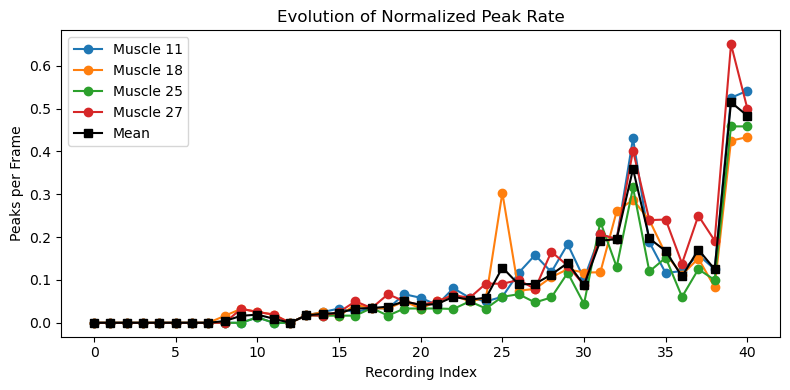

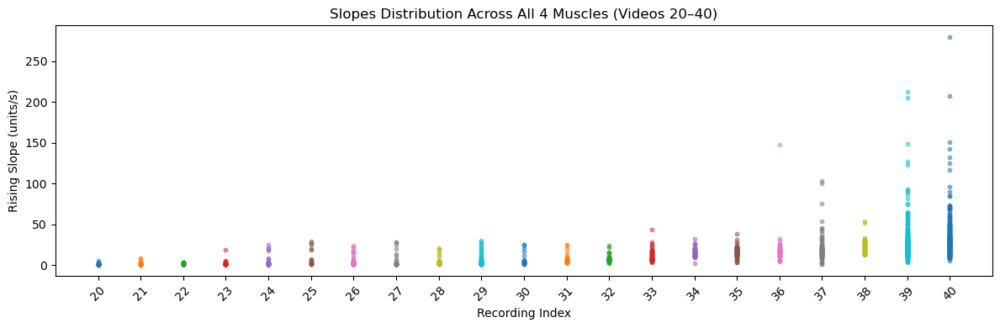

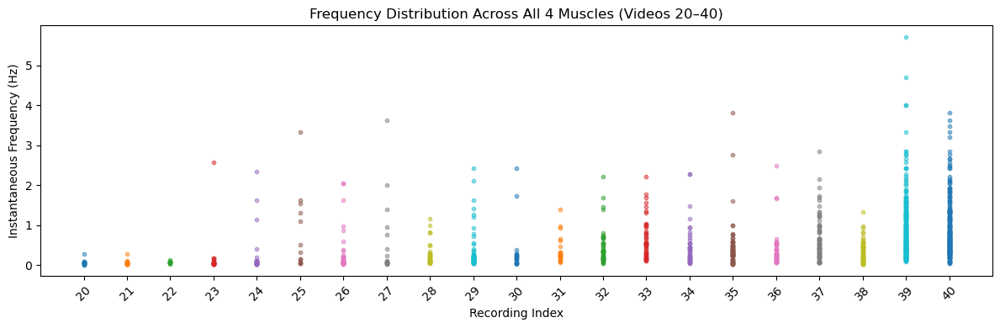

In [21]:
fs = 80.0  # effective sampling rate after filtering/downsampling

n_videos = len(muscle_traces)
n_muscles = len(muscle_traces[0])
videos = np.arange(n_videos)
muscle_labels = ['Muscle 11','Muscle 18','Muscle 25','Muscle 27']
pairs = ['1-2','1-3','1-4','2-3','2-4','3-4']

# Allocate storage
n_peaks_arr = np.zeros((n_videos, n_muscles), dtype=int)
peak_rate   = np.zeros((n_videos, n_muscles), dtype=float)
slopes_all  = [[None]*n_muscles for _ in range(n_videos)]
freqs_all   = [[None]*n_muscles for _ in range(n_videos)]
mean_slopes = np.full((n_videos, n_muscles), np.nan)
mean_freqs  = np.full((n_videos, n_muscles), np.nan)

# Compute metrics for each video & muscle
for vid_idx, traces in enumerate(muscle_traces):
    for mus_idx, trace in enumerate(traces):
        peaks, _ = find_peaks(trace, prominence=2,width=8, rel_height=0.5, distance=8)
        n_peaks_arr[vid_idx, mus_idx] = len(peaks)
        peak_rate[vid_idx, mus_idx] = len(peaks) / (len(trace)/80)

        if len(peaks) < 2:
            slopes_all[vid_idx][mus_idx] = np.array([])
            freqs_all[vid_idx][mus_idx] = np.array([])
            continue

        widths, _, left_ips, _ = peak_widths(trace, peaks, rel_height=0.5)
        left_idxs = np.round(left_ips).astype(int)

        amp_peak = trace[peaks]
        amp_left = trace[left_idxs]
        t_peak   = peaks / fs
        t_left   = left_idxs / fs

        slopes = (amp_peak - amp_left) / (t_peak - t_left)
        slopes_all[vid_idx][mus_idx] = slopes
        mean_slopes[vid_idx, mus_idx] = slopes.mean()

        peak_times = peaks / fs
        intervals  = np.diff(peak_times)
        freqs = 1.0 / intervals
        freqs_all[vid_idx][mus_idx] = freqs
        mean_freqs[vid_idx, mus_idx] = freqs.mean()

# 1) Plot normalized peak rate evolution
mean_act = np.mean(peak_rate, axis=1)
plt.figure(figsize=(8,4))
for j in range(n_muscles):
    plt.plot(videos[:41], peak_rate[:41,j], marker='o', label=muscle_labels[j])
plt.plot(videos[:41], mean_act[:41], marker='s', color='black', label= 'Mean')
plt.xlabel('Recording Index')
plt.ylabel('Peaks per Frame')
plt.title('Evolution of Normalized Peak Rate')
plt.legend()
plt.tight_layout()

# 2) Violin plots for slopes & frequency for recordings 20–40
idx_range = list(range(20, 41))

# Collect only videos that actually have data
valid_idxs_slopes = [
    v for v in idx_range
    if any(slopes_all[v][m].size > 0 for m in range(n_muscles))
]
valid_idxs_freqs = [
    v for v in idx_range
    if any(freqs_all[v][m].size > 0 for m in range(n_muscles))
]

# Build the violin‐plot data
slopes_violin_data = []
for v in valid_idxs_slopes:
    # concat the 4 muscle arrays (skip empty ones)
    arr = np.hstack(
        [slopes_all[v][m] for m in range(n_muscles) if slopes_all[v][m].size > 0]
    )
    slopes_violin_data.append(arr)

freqs_violin_data = []
for v in valid_idxs_freqs:
    arr = np.hstack(
        [freqs_all[v][m] for m in range(n_muscles) if freqs_all[v][m].size > 0]
    )
    freqs_violin_data.append(arr)

#── Plot Rising Slopes ──
plt.figure(figsize=(12, 4))
for i, v in enumerate(valid_idxs_slopes):
    y = slopes_violin_data[i]
    x = np.full_like(y, v)
    plt.scatter(x, y, alpha=0.5, s=10)
plt.xticks(valid_idxs_slopes, valid_idxs_slopes, rotation=45)
plt.xlabel('Recording Index')
plt.ylabel('Rising Slope (units/s)')
plt.title('Slopes Distribution Across All 4 Muscles (Videos 20–40)')
plt.tight_layout()

#── Plot Frequencies ──
plt.figure(figsize=(12, 4))
for i, v in enumerate(valid_idxs_freqs):
    y = freqs_violin_data[i]
    x = np.full_like(y, v)
    plt.scatter(x, y, alpha=0.5, s=10)
plt.xticks(valid_idxs_freqs, valid_idxs_freqs, rotation=45)
plt.xlabel('Recording Index')
plt.ylabel('Instantaneous Frequency (Hz)')
plt.title('Frequency Distribution Across All 4 Muscles (Videos 20–40)')
plt.tight_layout()

plt.show()

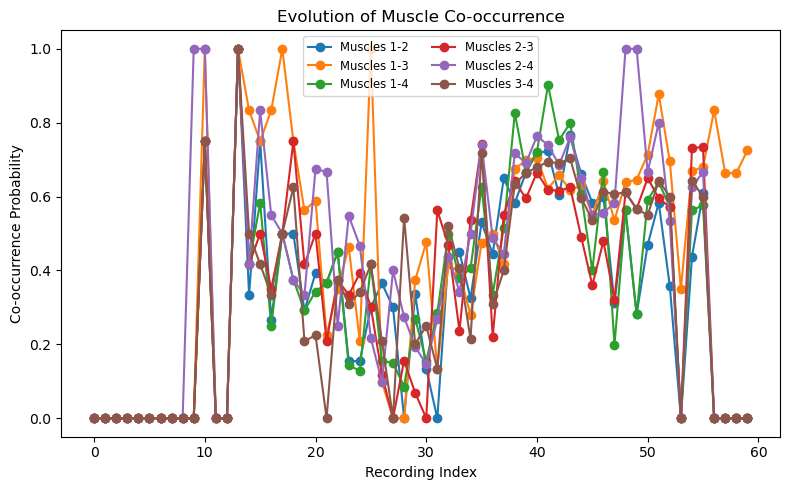

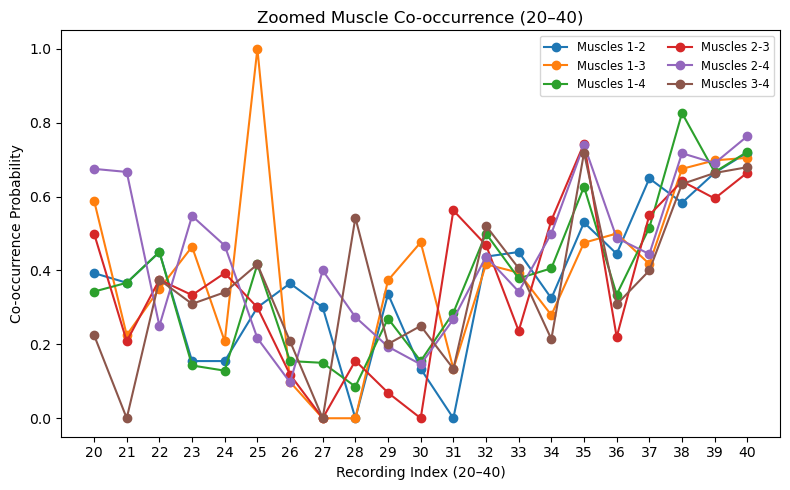

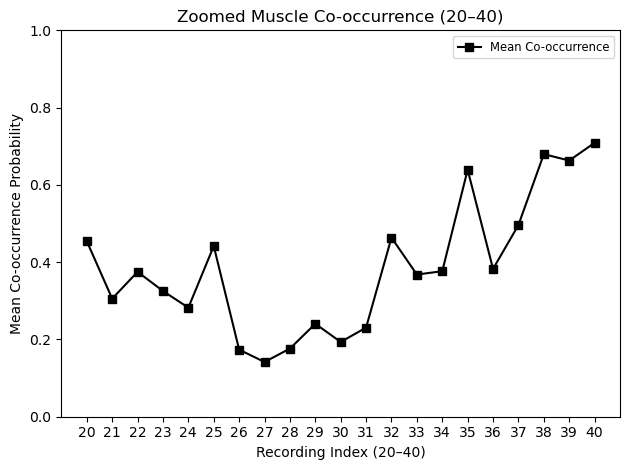

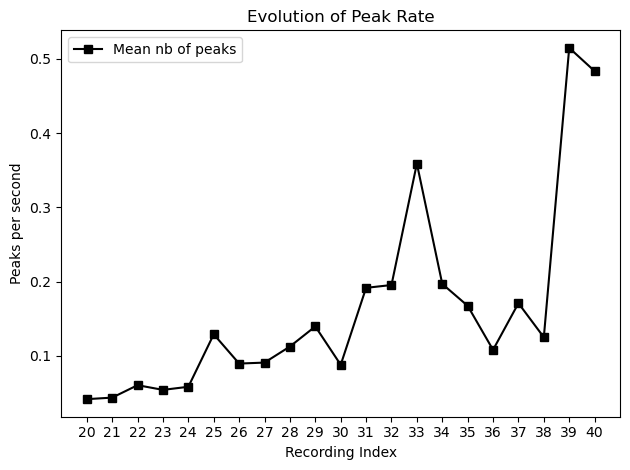

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

def event_cooccurrence_from_traces(muscle_traces, window=5,
                                   prominence=2, width=8,
                                   rel_height=0.5, distance=8):
    """
    Detect peaks in each muscle trace and compute pairwise event co-occurrence probabilities.

    Parameters
    ----------
    muscle_traces : list of length n_videos
        Each element is a list or array of 4 numpy arrays (temporal traces of each muscle).
    window : int
        Co-occurrence window in frames: consider events within +/- window frames as co-active.
    prominence : float
        Prominence parameter passed to scipy.signal.find_peaks.
    width : float
        Width parameter for peak detection.
    rel_height : float
        Relative height parameter for width calculation in find_peaks.
    distance : int
        Minimum separation of peaks in frames.

    Returns
    -------
    videos : np.ndarray, shape (n_videos,)
        Video indices 0..n_videos-1.
    pair_labels : list of str, length 6
        Labels '1-2','1-3','1-4','2-3','2-4','3-4'.
    cooccurrence : np.ndarray, shape (n_videos, 6)
        Symmetric co-occurrence probability per video per muscle pair.
    peaks_list : list of length n_videos
        List of detected peak indices for each muscle in each video.
    """
    n_videos = len(muscle_traces)
    videos = np.arange(n_videos)
    pairs_idx = [(0,1),(0,2),(0,3),(1,2),(1,3),(2,3)]
    pair_labels = [f"{i+1}-{j+1}" for i,j in pairs_idx]

    cooccurrence = np.zeros((n_videos, len(pairs_idx)))
    peaks_list = []

    for v in range(n_videos):
        traces = muscle_traces[v]
        # detect peaks for each of the 4 muscles
        peaks = []
        for tr in traces:
            pks, _ = find_peaks(tr,
                                prominence=prominence,
                                width=width,
                                rel_height=rel_height,
                                distance=distance)
            peaks.append(pks)
        peaks_list.append(peaks)

        # compute co-occurrence
        for k, (i, j) in enumerate(pairs_idx):
            pi = peaks[i]
            pj = peaks[j]
            if len(pi)==0 or len(pj)==0:
                cooccurrence[v, k] = 0.0
                continue
            # true if difference within window
            diffs = np.abs(pi[:,None] - pj[None,:]) <= window
            count_i2j = np.sum(np.any(diffs, axis=1))
            count_j2i = np.sum(np.any(diffs.T, axis=1))
            p_i2j = count_i2j / len(pi)
            p_j2i = count_j2i / len(pj)
            cooccurrence[v, k] = 0.5*(p_i2j + p_j2i)

    return videos, pair_labels, cooccurrence, peaks_list


def plot_cooccurrence(videos, pair_labels, cooccurrence, idx_range=None):
    """
    Plot co-occurrence probabilities. Optionally zoom on an index range.
    """
    plt.figure(figsize=(8,5))
    for k,label in enumerate(pair_labels):
        plt.plot(videos, cooccurrence[:,k], marker='o', label=f"Muscles {label}")
    plt.xlabel("Recording Index")
    plt.ylabel("Co-occurrence Probability")
    plt.title("Evolution of Muscle Co-occurrence")
    plt.legend(ncol=2, fontsize='small')
    plt.tight_layout()
    plt.show()

    # Zoomed-in
    if idx_range is not None:
        zoom = np.array(idx_range)
        plt.figure(figsize=(8,5))
        # plot each pair
        for k, label in enumerate(pair_labels):
            plt.plot(zoom, cooccurrence[zoom,k], marker='o', label=f"Muscles {label}")

        plt.xlabel(f"Recording Index ({zoom.min()}–{zoom.max()})")
        plt.xticks(zoom)
        plt.ylabel("Co-occurrence Probability")
        plt.yticks(np.arange(0,1.2,0.2))
        plt.title(f"Zoomed Muscle Co-occurrence ({zoom.min()}–{zoom.max()})")
        plt.legend(ncol=2, fontsize='small')
        plt.tight_layout()
        plt.show()
        # plot mean across all pairs
        mean_vals = cooccurrence[zoom].mean(axis=1)
        plt.plot(zoom, mean_vals, marker='s', linestyle='-', label='Mean Co-occurrence', color='black')
        plt.xlabel(f"Recording Index ({zoom.min()}–{zoom.max()})")
        plt.xticks(zoom)
        plt.ylabel("Mean Co-occurrence Probability")
        plt.yticks(np.arange(0,1.2,0.2))
        plt.title(f"Zoomed Muscle Co-occurrence ({zoom.min()}–{zoom.max()})")
        plt.legend(ncol=2, fontsize='small')
        plt.tight_layout()
        plt.show()

        plt.plot(videos[idx_range], mean_act[idx_range], marker='s', color='black', label= 'Mean nb of peaks')
        plt.xticks(zoom)
        plt.xlabel('Recording Index')
        plt.ylabel('Peaks per second')
        plt.title('Evolution of Peak Rate')
        plt.legend()
        plt.tight_layout()



# --- Example usage (uncomment and run in your workspace) ---
videos, pair_labels, cooccurrences, peaks_list = event_cooccurrence_from_traces(muscle_traces, window=40)
plot_cooccurrence(videos, pair_labels,cooccurrences, idx_range=range(20, 41))


In [17]:
temporal_components.shape

(2715, 40)

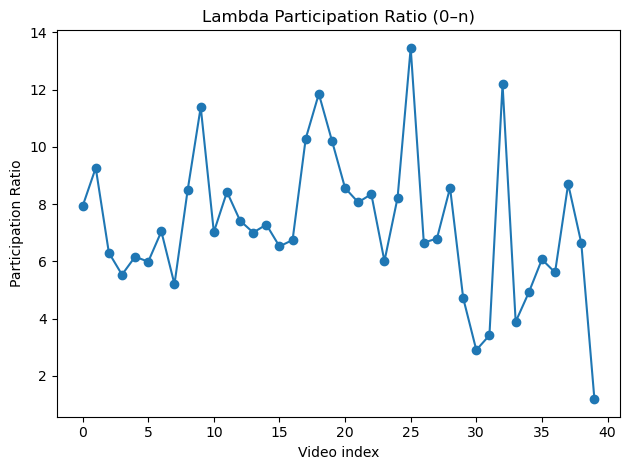

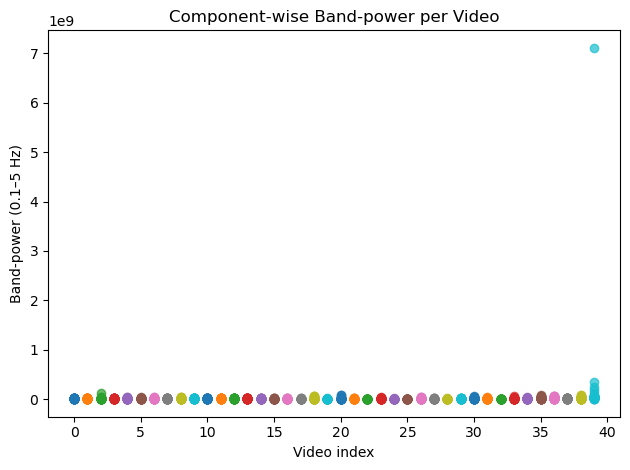

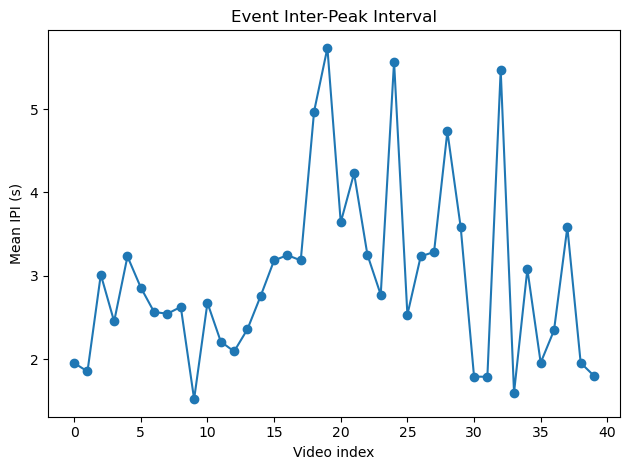

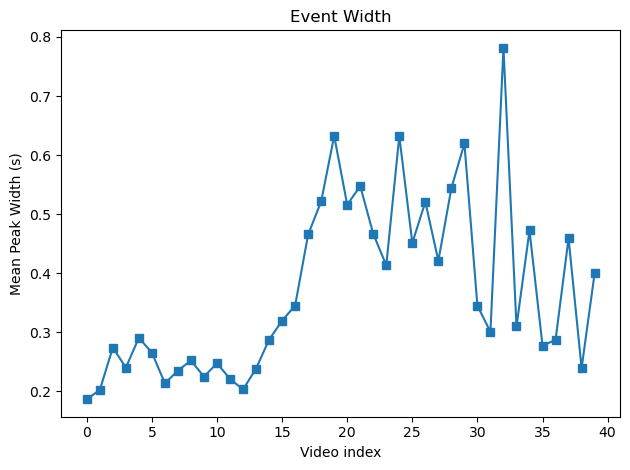

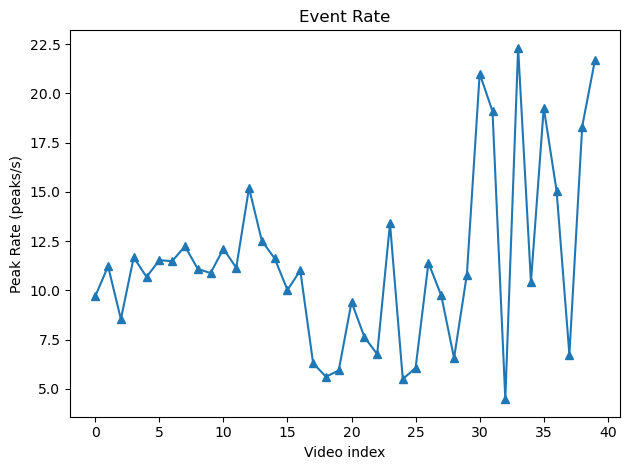

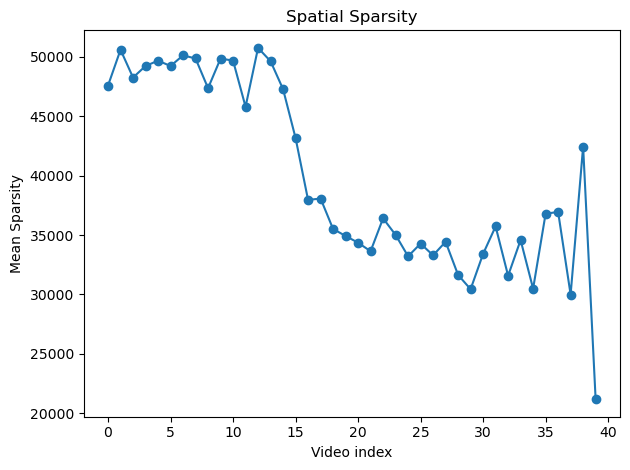

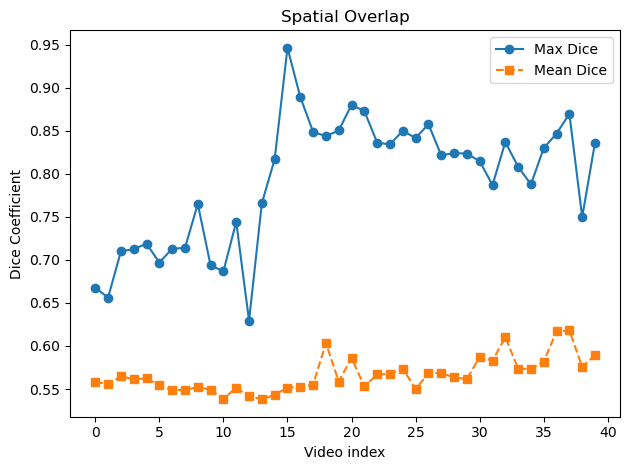

In [ ]:

# Sampling rate of temporal traces (Hz)
fs = 80.0

# -- Helper functions --
# Temporal metrics operate on W (shape: [T, r])
def participation_ratio(W):
    # Covariance across components: r x r
    cov = W.T @ W
    eigs = np.linalg.eigvalsh(cov)
    eigs = np.clip(eigs, 0, None)
    S = np.sum(eigs)
    return (S * S / np.sum(eigs * eigs)) if S > 0 else 0.0

def mean_bandpower(W, fmin=0.1, fmax=5.0):
    # W: T x r
    T, r = W.shape
    freqs = np.fft.rfftfreq(T, d=1/fs)
    vals = []
    for i in range(r):
        w = W[:, i]
        p = np.abs(np.fft.rfft(w - w.mean()))**2
        m = (freqs >= fmin) & (freqs <= fmax)
        vals.append(np.trapz(p[m], freqs[m]))
    return vals

def mean_ipi(W):
    all_ipi = []
    T, r = W.shape
    for i in range(r):
        w = W[:, i]
        peaks, _ = find_peaks(w, prominence=2, width=8, rel_height=0.5, distance=8)
        if len(peaks) > 1:
            all_ipi.extend(np.diff(peaks) / fs)
    return np.nan if not all_ipi else np.mean(all_ipi)

def mean_peak_width(W, **pkw_kwargs):
    widths = []
    T, r = W.shape
    for i in range(r):
        w = W[:, i]
        peaks, _ = find_peaks(w, prominence=2, width=8, rel_height=0.5, distance=8)
        if len(peaks) >= 1:
            w_widths, _, _, _ = peak_widths(w, peaks, **pkw_kwargs)
            widths.extend((w_widths / fs).tolist())
    return np.nan if not widths else np.mean(widths)

def peak_rate(W):
    T, r = W.shape
    total_peaks = sum(
        len(find_peaks(W[:, i], prominence=2, width=8, rel_height=0.5, distance=8)[0])
        for i in range(r)
    )
    return total_peaks / (T / fs)

# Spatial metrics operate on H_stack (shape: [r, H, W])
def comp_sparsity(h):
    w = h.ravel()
    L1 = np.sum(np.abs(w))
    L2 = np.linalg.norm(w)
    return (L1**2) / (L2**2) if L2 > 0 else np.nan

def dice(m1, m2):
    inter = np.logical_and(m1, m2).sum()
    tot = m1.sum() + m2.sum()
    return (2 * inter / tot) if tot > 0 else 0.0

def max_dice(Ws, pct=50):
    masks = [(W > np.percentile(W, pct)) for W in Ws]
    M = 0.0
    for i in range(len(masks)):
        for j in range(i + 1, len(masks)):
            M = max(M, dice(masks[i], masks[j]))
    return M

def mean_dice(Ws, pct=50):
    masks = [(W > np.percentile(W, pct)) for W in Ws]
    vals = []
    for i in range(len(masks)):
        for j in range(i + 1, len(masks)):
            vals.append(dice(masks[i], masks[j]))
    return np.mean(vals) if vals else 0.0

# -- Main loop over videos 0–n --
# nmfs[v] should be a tuple: (W: [T, r], H_stack: [r, height, width])
n = min(40, len(nmfs))
idx = np.arange(n)

# Initialize metric lists
PR, BP_all, IPI, WIDTH, RATE = [], [], [], [], []
SP, MD, mD = [], [], []

for v in idx:
    # Unpack W (temporal: T x r) and H_stack (spatial: r x H x W)
    W = nmfs[v][1]
    H_stack = nmfs[v][0]

    # Temporal metrics
    PR.append(participation_ratio(W))
    BP_all.append(mean_bandpower(W))  # list of bandpowers per component
    IPI.append(mean_ipi(W))
    WIDTH.append(mean_peak_width(W, rel_height=0.5))
    RATE.append(peak_rate(W))

    # Spatial metrics
    # Flatten each spatial component mask
    sparsities = [comp_sparsity(H_stack[i]) for i in range(H_stack.shape[0])]
    SP.append(np.nanmean(sparsities))
    MD.append(max_dice([H_stack[i] for i in range(H_stack.shape[0])]))
    mD.append(mean_dice([H_stack[i] for i in range(H_stack.shape[0])]))

# -- Plotting --
# Participation Ratio
plt.figure(); plt.plot(idx, PR, marker='o')
plt.xlabel("Video index"); plt.ylabel("Participation Ratio")
plt.title("Lambda Participation Ratio (0–n)"); plt.tight_layout(); plt.show()

# Bandpower: scatter all components per video
plt.figure()
for v, vals in enumerate(BP_all):
    xs = np.full(len(vals), v)
    plt.scatter(xs, vals, marker='o', alpha=0.7)
plt.xlabel("Video index"); plt.ylabel("Band-power (0.1–5 Hz)")
plt.title("Component-wise Band-power per Video"); plt.tight_layout(); plt.show()

# Mean IPI per video
plt.figure(); plt.plot(idx, IPI, marker='o')
plt.xlabel("Video index"); plt.ylabel("Mean IPI (s)")
plt.title("Event Inter-Peak Interval"); plt.tight_layout(); plt.show()

# Mean peak width per video
plt.figure(); plt.plot(idx, WIDTH, marker='s')
plt.xlabel("Video index"); plt.ylabel("Mean Peak Width (s)")
plt.title("Event Width"); plt.tight_layout(); plt.show()

# Peak rate per video
plt.figure(); plt.plot(idx, RATE, marker='^')
plt.xlabel("Video index"); plt.ylabel("Peak Rate (peaks/s)")
plt.title("Event Rate"); plt.tight_layout(); plt.show()

# Spatial sparsity per video
plt.figure(); plt.plot(idx, SP, marker='o')
plt.xlabel("Video index"); plt.ylabel("Mean Sparsity")
plt.title("Spatial Sparsity"); plt.tight_layout(); plt.show()

# Spatial overlap: max and mean Dice
plt.figure();
plt.plot(idx, MD, marker='o', linestyle='-', label='Max Dice')
plt.plot(idx, mD, marker='s', linestyle='--', label='Mean Dice')
plt.xlabel("Video index"); plt.ylabel("Dice Coefficient")
plt.title("Spatial Overlap"); plt.legend(); plt.tight_layout(); plt.show()

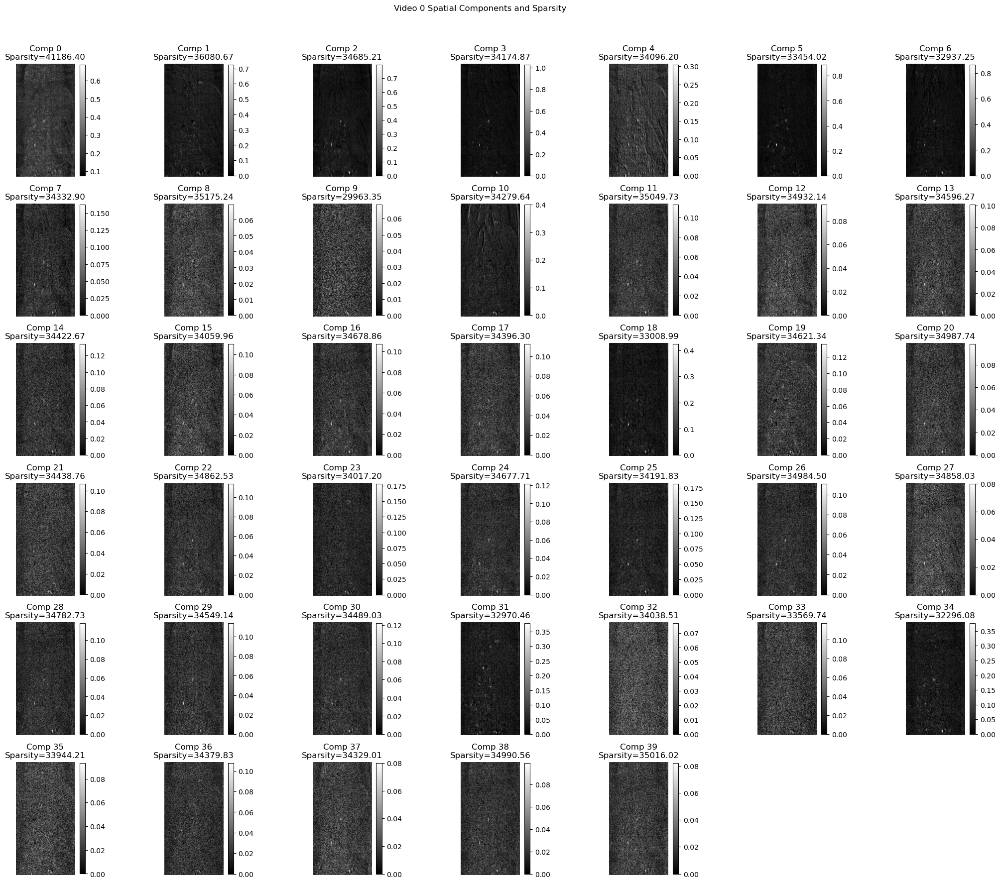

29963.347858553687


In [11]:
def comp_sparsity(h):
    """
    Compute sparsity of a single spatial component h.
    Sparsity metric: (L1_norm^2) / (L2_norm^2)
    """
    arr = h.ravel()
    L1 = np.sum(np.abs(arr))
    L2 = np.linalg.norm(arr)
    return (L1**2) / (L2**2) if L2 > 0 else np.nan


def plot_spatial_components(H, title_prefix="Video" ):
    """
    Plot each spatial component in H and annotate with sparsity.
    H: numpy array of shape [r, height, width]
    """
    r, h, w = H.shape
    # Determine grid size for subplots
    cols = int(np.ceil(np.sqrt(r)))
    rows = int(np.ceil(r / cols))

    fig, axes = plt.subplots(rows, cols, figsize=(cols*3, rows*3))
    axes = axes.flatten()

    sparsities = []
    for i in range(r):
        si = comp_sparsity(H[i])
        sparsities.append(si)
        ax = axes[i]
        img = ax.imshow(H[i], cmap='gray')
        ax.set_title(f"Comp {i}\nSparsity={si:.2f}")
        ax.axis('off')
        fig.colorbar(img, ax=ax, fraction=0.046, pad=0.04)

    # Turn off unused axes
    for j in range(r, len(axes)):
        axes[j].axis('off')

    plt.suptitle(f"{title_prefix} Spatial Components and Sparsity")
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()
    print(np.min(sparsities))
H_stack, W = nmfs[0]

plot_spatial_components(H_stack, title_prefix=f"Video {0}")

c:\ProgramData\miniconda3\envs\mthesis_env\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


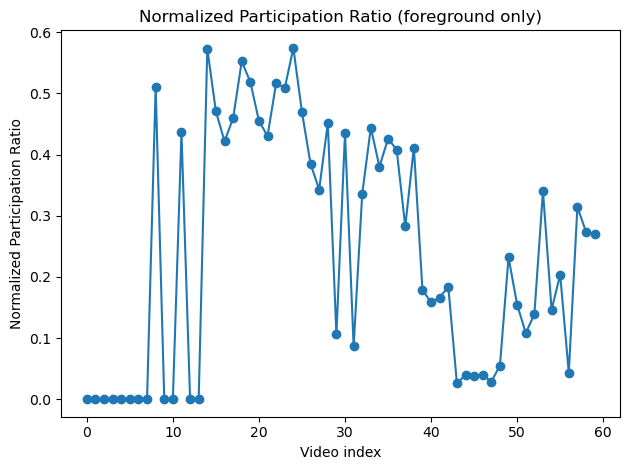

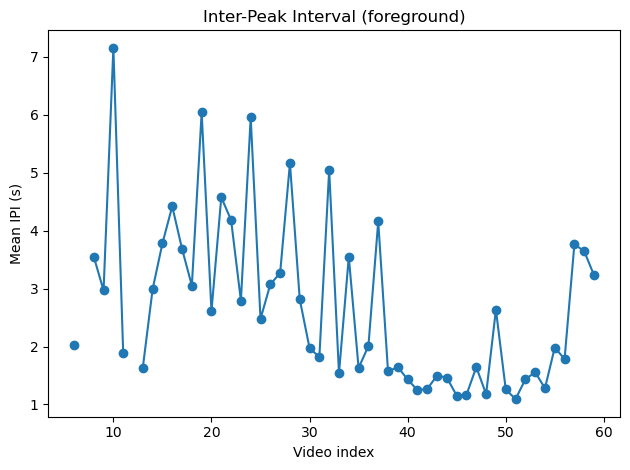

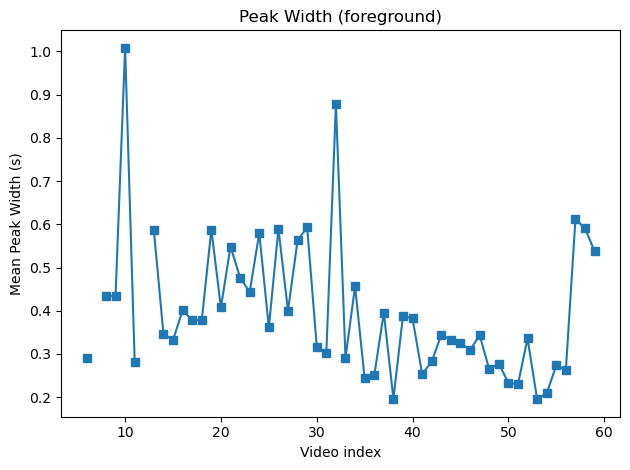

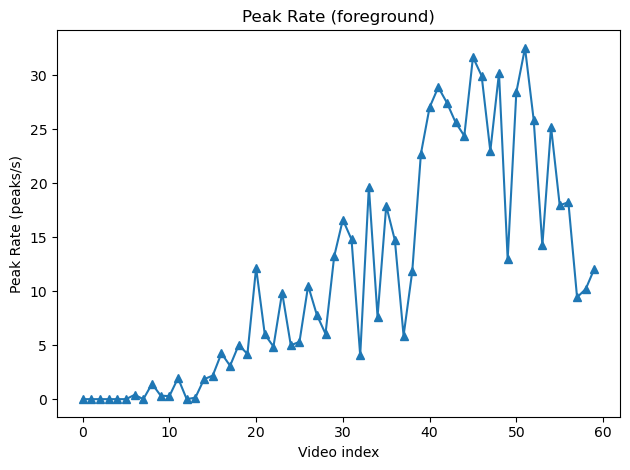

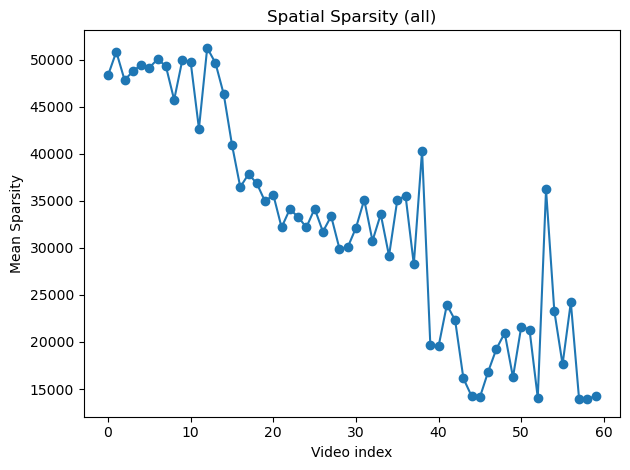

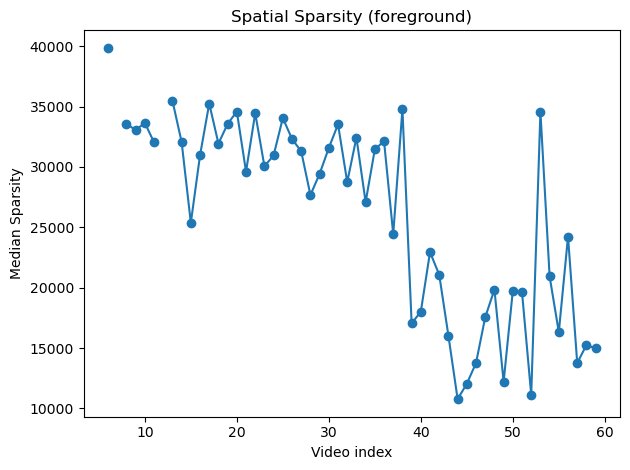

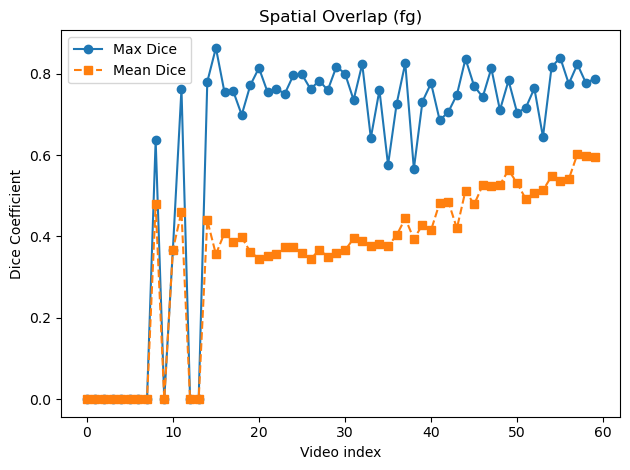

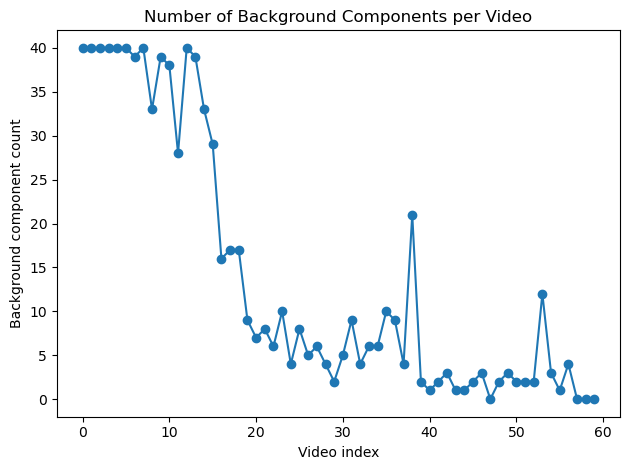

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks, peak_widths

# Sampling rate of temporal traces (Hz)
fs = 80.0
# Absolute spatial sparsity threshold for background components
bg_sparsity_thr = 40000.0  # adjust based on your sparsity scale

# -- Helper functions --
# Temporal metrics operate on W (shape: [T, r])
def participation_ratio(W):
    cov = W.T @ W
    eigs = np.linalg.eigvalsh(cov)
    eigs = np.clip(eigs, 0, None)
    S = np.sum(eigs)
    return (S * S / np.sum(eigs * eigs)) if S > 0 else 0.0


def mean_ipi(W):
    all_ipi = []
    T, r = W.shape
    for i in range(r):
        w = W[:, i]
        peaks, _ = find_peaks(w, prominence=2, width=8, rel_height=0.5, distance=8)
        if len(peaks) > 1:
            all_ipi.extend(np.diff(peaks) / fs)
    return np.nan if not all_ipi else np.mean(all_ipi)

def mean_peak_width(W, **pkw_kwargs):
    widths = []
    T, r = W.shape
    for i in range(r):
        w = W[:, i]
        peaks, _ = find_peaks(w, prominence=2, width=8, rel_height=0.5, distance=8)
        if len(peaks) >= 1:
            w_widths, _, _, _ = peak_widths(w, peaks, **pkw_kwargs)
            widths.extend((w_widths / fs).tolist())
    return np.nan if not widths else np.mean(widths)

def peak_rate(W):
    T, r = W.shape
    total_peaks = sum(
        len(find_peaks(W[:, i], prominence=2, width=8, rel_height=0.5, distance=8)[0])
        for i in range(r)
    )
    return total_peaks / (T / fs)

# Spatial metrics operate on H_stack (shape: [r, H, W])
def comp_sparsity(h):
    arr = h.ravel()
    L1 = np.sum(np.abs(arr))
    L2 = np.linalg.norm(arr)
    return (L1**2) / (L2**2) if L2 > 0 else np.nan

def dice(m1, m2):
    inter = np.logical_and(m1, m2).sum()
    tot = m1.sum() + m2.sum()
    return (2 * inter / tot) if tot > 0 else 0.0

def max_dice(Ws, pct=75):
    masks = [(W > np.percentile(W, pct)) for W in Ws]
    M = 0.0
    for i in range(len(masks)):
        for j in range(i + 1, len(masks)):
            M = max(M, dice(masks[i], masks[j]))
    return M

def mean_dice(Ws, pct=75):
    masks = [(W > np.percentile(W, pct)) for W in Ws]
    vals = []
    for i in range(len(masks)):
        for j in range(i + 1, len(masks)):
            vals.append(dice(masks[i], masks[j]))
    return np.mean(vals) if vals else 0.0

# -- Main loop over videos 0–n --
# nmfs[v] should be a tuple: (H_stack: [r, H, W], W: [T, r])
n = min(60, len(nmfs))
idx = np.arange(n)

# Initialize metric lists
PR,  IPI, WIDTH, RATE = [], [], [], []
SP, MD, mD, BG_COUNT = [], [], [], []  # BG_COUNT: number of background comps
# fg_SP = []
for v in idx:
    H_stack, W = nmfs[v]
    # Compute spatial sparsity per component
    sparsities = np.array([comp_sparsity(H_stack[i]) for i in range(H_stack.shape[0])])
    # Identify background components by absolute threshold
    bg_idx = np.where(sparsities > bg_sparsity_thr)[0]
    fg_idx = np.where(sparsities <= bg_sparsity_thr)[0]

    # Count background components
    BG_COUNT.append(len(bg_idx))
    fg_sparsities = np.array([comp_sparsity(H_stack[i]) for i in fg_idx])
    # Spatial metrics (all components)
    SP.append(np.nanmean(sparsities))
    # fg_SP.append(np.nanmedian(fg_sparsities))
    H_fg = [H_stack[i] for i in fg_idx]
    MD.append(max_dice(H_fg))
    mD.append(mean_dice(H_fg))

    # Subset temporal data to foreground components only
    W_fg = W[:, fg_idx]

    # Temporal metrics on foreground only
    PR_raw = participation_ratio(W_fg)
    if W_fg.shape[1]>2:
        PR.append(PR_raw/W_fg.shape[1])
    else: PR.append(0.0)
    # BP_all.append(mean_bandpower(W_fg))
    IPI.append(mean_ipi(W_fg))
    WIDTH.append(mean_peak_width(W_fg, rel_height=0.5))
    RATE.append(peak_rate(W_fg))

# -- Plotting --
plt.figure(); plt.plot(idx, PR, marker='o')
plt.xlabel("Video index"); plt.ylabel("Normalized Participation Ratio")
plt.title("Normalized Participation Ratio (foreground only)"); plt.tight_layout(); plt.show()

plt.figure(); plt.plot(idx, IPI, marker='o')
plt.xlabel("Video index"); plt.ylabel("Mean IPI (s)")
plt.title("Inter-Peak Interval (foreground)"); plt.tight_layout(); plt.show()

plt.figure(); plt.plot(idx, WIDTH, marker='s')
plt.xlabel("Video index"); plt.ylabel("Mean Peak Width (s)")
plt.title("Peak Width (foreground)"); plt.tight_layout(); plt.show()

plt.figure(); plt.plot(idx, RATE, marker='^')
plt.xlabel("Video index"); plt.ylabel("Peak Rate (peaks/s)")
plt.title("Peak Rate (foreground)"); plt.tight_layout(); plt.show()

plt.figure(); plt.plot(idx, SP, marker='o')
plt.xlabel("Video index"); plt.ylabel("Mean Sparsity")
plt.title("Spatial Sparsity (all)"); plt.tight_layout(); plt.show()

# plt.figure(); plt.plot(idx, fg_SP, marker='o')
# plt.xlabel("Video index"); plt.ylabel("Median Sparsity")
# plt.title("Spatial Sparsity (foreground)"); plt.tight_layout(); plt.show()

plt.figure()
plt.plot(idx, MD, marker='o', label='Max Dice')
plt.plot(idx, mD, marker='s', linestyle='--', label='Mean Dice')
plt.xlabel("Video index"); plt.ylabel("Dice Coefficient")
plt.title("Spatial Overlap (fg)"); plt.legend(); plt.tight_layout(); plt.show()

# Plot number of background components per video
plt.figure(); plt.plot(idx, BG_COUNT, marker='o')
plt.xlabel("Video index"); plt.ylabel("Background component count")
plt.title("Number of Background Components per Video")
plt.tight_layout(); plt.show()

In [79]:
import matplotlib
class Params:
    LINEWIDTH = 2.0
    LABEL_SIZE = 12
params = Params()
def make_nice_spines(
    ax: matplotlib.axes.Axes,
    linewidth=params.LINEWIDTH,
    setticks: bool = True,
):
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_position(("outward", 2 * linewidth))
    ax.spines["bottom"].set_position(("outward", 2 * linewidth))
    ax.tick_params(width=linewidth)
    ax.tick_params(length=2.5 * linewidth)
    ax.tick_params(labelsize=params.LABEL_SIZE)
    ax.spines["left"].set_linewidth(linewidth)
    ax.spines["bottom"].set_linewidth(linewidth)
    ax.spines["top"].set_linewidth(0)
    ax.spines["right"].set_linewidth(0)
    # axis label legends
    ax.xaxis.label.set_size(params.LABEL_SIZE)
    ax.yaxis.label.set_size(params.LABEL_SIZE)
    if setticks:
        ax = set_ticks(ax)
    return ax
def make_nice_cbar(cbar: matplotlib.colorbar.Colorbar, linewidth=params.LINEWIDTH):
    cbar.outline.set_linewidth(0.5 * linewidth)
    cbar.ax.tick_params(width=linewidth)
    cbar.ax.tick_params(length=2.5 * linewidth)
    cbar.ax.tick_params(labelsize=params.LABEL_SIZE)
    cbar.ax.yaxis.set_major_locator(plt.MaxNLocator(nbins=5))
    cbar.ax.yaxis.label.set_size(params.LABEL_SIZE)
    return cbar
def make_axis_disappear(ax: matplotlib.axes.Axes):
    sides = ["top", "left", "right", "bottom"]
    for side in sides:
        ax.spines[side].set_visible(False)
        ax.spines[side].set_linewidth(0)
        ax.set_xticks([])
        ax.set_yticks([])
def set_ticks(ax: matplotlib.axes.Axes, n_ticks: int = 9):
    """
    Set the number of ticks on the x and y axes,
    always including the start (0) and end values.
    """
    # X-axis ticks
    x_start, x_stop = ax.get_xlim()
    x_start = max(0, x_start)  # Force x_start to be at least 0
    xticks = np.linspace(x_start, x_stop, n_ticks)
    xticks[0] = 0  # Ensure first tick is exactly 0
    xticks[-1] = int(x_stop)  # Ensure last tick is integer endpoint
    xticks = [int(x) for x in xticks]
    ax.set_xticks(xticks)

    # Y-axis ticks (optional to force 0 here as well; depends on your data)
    y_start, y_stop = ax.get_ylim()
    yticks = np.linspace(y_start, y_stop, n_ticks)
    yticks[0] = int(y_start)
    yticks[-1] = int(y_stop-1)
    yticks = [int(y) for y in yticks]
    ax.set_yticks(yticks)

    return ax


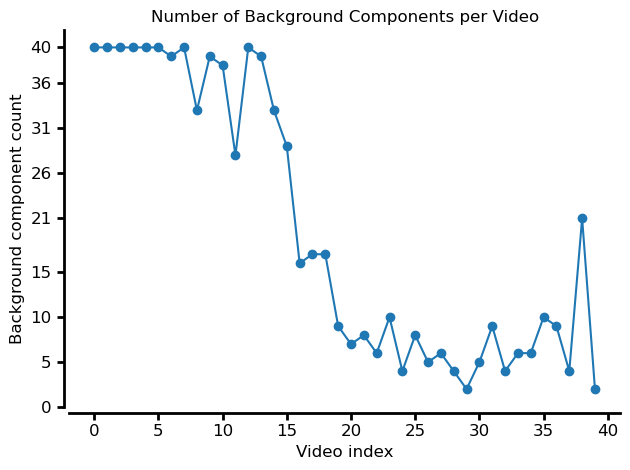

In [81]:
fig, ax = plt.subplots()
ax.plot(idx, BG_COUNT, marker='o')
ax.set_xlabel("Video index")
ax.set_ylabel("Background component count")
ax.set_title("Number of Background Components per Video")

# Apply spine and tick formatting
make_nice_spines(ax)


plt.tight_layout()
plt.show()